In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import missingno as msno
import matplotlib.dates as mdates
import warnings

pd.options.display.precision = 2
warnings.filterwarnings("ignore")

In [ ]:
locations_df = pd.read_csv('Locations.csv')
invoices_df = pd.read_csv('Invoices.csv')
tanks_df = pd.read_csv('Tanks.csv')
fuel_level_part1_df = pd.read_csv('Fuel_Level_Part_1.csv')
fuel_level_part2_df = pd.read_csv('Fuel_Level_Part_2.csv')

# 1. Explore Datasets and Description Analysis

## 1.1 Locations

In [ ]:
# 1.1.1 rename columns
locations_df.rename(columns={'Gas Station Location': 'gas_station_location',
                             'Gas Station Name': 'gas_station_name',
                             'Gas Station Address': 'gas_station_address',
                             'Gas Station Latitude': 'gas_station_latitude',
                             'Gas Station Longitude': 'gas_station_longitude'},
                    inplace=True)

In [ ]:
# 1.1.2 explore the dataframe
print(f"This DataFrame's shape is {locations_df.shape}")  # It's a very small dataset
display(locations_df)

This DataFrame's shape is (8, 5)


,gas_station_location,gas_station_name,gas_station_address,gas_station_latitude,gas_station_longitude
0,1,EastMount,"386 Upper Gage Ave, Hamilton, ON L8V 4H9, Canada",43.23,-79.84
1,2,Eastgate,"75 Centennial Pkwy N E5, Hamilton, ON L8E 2P2,...",43.23,-79.76
2,3,Central,"80 Park St N, Hamilton, ON L8R 2M9, Canada",43.26,-79.87
3,4,Chedoke,"16 McMaster Ave, Dundas, ON L9H 0A8, Canada",43.26,-79.94
4,5,Mountain View,"985 Scenic Dr, Hamilton, ON L9C 1H7, Canada",43.24,-79.92
5,6,Oakville,"503 Plains Rd E, Burlington, ON L7T 2E2, Canada",43.32,-79.84
6,7,Circle,"1170 Upper James St, Hamilton, ON L9C 3B1, Canada",43.22,-79.89
7,8,Chappel,"1530 Upper Sherman Ave, Hamilton, ON L8W 1C5, ...",38.88,-77.02


In [ ]:
# 1.1.3 Description Analysis
display(locations_df.info())
display(locations_df.describe())
display(locations_df.describe(include = 'all'))

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8 entries, 0 to 7
Data columns (total 5 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   gas_station_location   8 non-null      int64  
 1   gas_station_name       8 non-null      object 
 2   gas_station_address    8 non-null      object 
 3   gas_station_latitude   8 non-null      float64
 4   gas_station_longitude  8 non-null      float64
dtypes: float64(2), int64(1), object(2)
memory usage: 452.0+ bytes


None

,gas_station_location,gas_station_latitude,gas_station_longitude
count,8.00,8.00,8.00
mean,4.50,42.71,-79.51
std,2.45,1.55,1.01
min,1.00,38.88,-79.94
25%,2.75,43.23,-79.90
50%,4.50,43.24,-79.85
75%,6.25,43.26,-79.82
max,8.00,43.32,-77.02


,gas_station_location,gas_station_name,gas_station_address,gas_station_latitude,gas_station_longitude
count,8.00,8,8,8.00,8.00
unique,NaN,8,8,NaN,NaN
top,NaN,EastMount,"386 Upper Gage Ave, Hamilton, ON L8V 4H9, Canada",NaN,NaN
freq,NaN,1,1,NaN,NaN
mean,4.50,NaN,NaN,42.71,-79.51
std,2.45,NaN,NaN,1.55,1.01
min,1.00,NaN,NaN,38.88,-79.94
25%,2.75,NaN,NaN,43.23,-79.90
50%,4.50,NaN,NaN,43.24,-79.85
75%,6.25,NaN,NaN,43.26,-79.82


## 1.2 Tanks

In [ ]:
# 1.2.1 rename columns
tanks_df.rename(columns={'Tank ID': 'tank_id',
                         'Tank Location': 'tank_location',
                         'Tank Number': 'tank_number',
                         'Tank Type': 'tank_type',
                         'Tank Capacity': 'tank_capacity'},
                inplace=True)

# replace tank type U P as G
tanks_df['tank_type'] = tanks_df['tank_type'].replace({'U': 'G', 'P': 'G'})

# Delete all the spaces in tank_id column
tanks_df['tank_id'] = tanks_df['tank_id'].astype(str).str.replace(' ', '')

In [ ]:
# 1.2.2 explore the dataframe
print(f"This DataFrame's shape is {tanks_df.shape}") # It's also a small dataset
display(tanks_df)

This DataFrame's shape is (23, 5)


,tank_id,tank_location,tank_number,tank_type,tank_capacity
0,T10,1,1,G,40000
1,T11,1,2,G,40000
2,T12,1,3,D,40000
3,T13,1,4,G,40000
4,T14,1,5,G,40000
5,T15,1,6,D,40000
6,T16,2,1,G,70000
7,T17,2,2,D,40000
8,T18,2,3,G,40000
9,T19,2,4,D,70000


In [ ]:
print(f'The tanks ids are {tanks_df.tank_id.unique()}')
print()
print('Check how many tanks there are for each tank type in each location:')
tanks_df.groupby(by = ['tank_location', 'tank_type']).tank_id.count()

The tanks ids are ['T10' 'T11' 'T12' 'T13' 'T14' 'T15' 'T16' 'T17' 'T18' 'T19' 'T20' 'T21'
 'T22' 'T23' 'T24' 'T25' 'T26' 'T27' 'T28' 'T29' 'T30' 'T31' 'T32']

Check how many tanks there are for each tank type in each location:


tank_location  tank_type
1              D            2
               G            4
2              D            2
               G            2
3              D            1
               G            1
4              D            1
               G            1
5              D            1
               G            1
6              D            1
               G            2
7              D            1
               G            1
8              D            1
               G            1
Name: tank_id, dtype: int64

In [ ]:
# 1.2.3 description analysis
display(tanks_df.info())
display(tanks_df.describe())
display(tanks_df.describe(include = 'all'))

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23 entries, 0 to 22
Data columns (total 5 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   tank_id        23 non-null     object
 1   tank_location  23 non-null     int64 
 2   tank_number    23 non-null     int64 
 3   tank_type      23 non-null     object
 4   tank_capacity  23 non-null     int64 
dtypes: int64(3), object(2)
memory usage: 1.0+ KB


None

,tank_location,tank_number,tank_capacity
count,23.00,23.00,23.00
mean,3.74,2.26,36086.96
std,2.47,1.39,14844.38
min,1.00,1.00,5000.00
25%,1.50,1.00,30000.00
50%,3.00,2.00,40000.00
75%,6.00,3.00,40000.00
max,8.00,6.00,70000.00


,tank_id,tank_location,tank_number,tank_type,tank_capacity
count,23,23.00,23.00,23,23.00
unique,23,NaN,NaN,2,NaN
top,T10,NaN,NaN,G,NaN
freq,1,NaN,NaN,13,NaN
mean,NaN,3.74,2.26,NaN,36086.96
std,NaN,2.47,1.39,NaN,14844.38
min,NaN,1.00,1.00,NaN,5000.00
25%,NaN,1.50,1.00,NaN,30000.00
50%,NaN,3.00,2.00,NaN,40000.00
75%,NaN,6.00,3.00,NaN,40000.00


## 1.3 Invoices

In [ ]:
# 1.3.1 Clean the dataset

# Rename Columns
invoices_df.rename(columns={
    'Invoice Date': 'invoice_date',
    'Invoice ID': 'invoice_id',
    'Invoice Gas Station Location': 'invoice_gas_station_location',
    'Gross Purchase Cost': 'gross_purchase_cost',
    'Amount Purchased': 'amount_purchased',
    'Fuel Type': 'fuel_type'
}, inplace=True)

# change date to datetime
invoices_df["invoice_date"] = pd.to_datetime(invoices_df["invoice_date"])

     invoice_date  invoice_id  invoice_gas_station_location  \
2      2017-01-02     10002.0                             1   
4      2017-01-02         NaN                             2   
19     2017-01-05         NaN                             1   
33     2017-01-09         NaN                             1   
60     2017-01-17         NaN                             3   
128    2017-02-08         NaN                             2   
178    2017-02-24         NaN                             1   
205    2017-03-06         NaN                             5   
239    2017-03-15         NaN                             4   
293    2017-04-04         NaN                             2   
320    2017-04-11         NaN                             6   
363    2017-04-26         NaN                             3   
392    2017-05-05         NaN                             1   
420    2017-05-12         NaN                             5   
452    2017-05-24         NaN                          

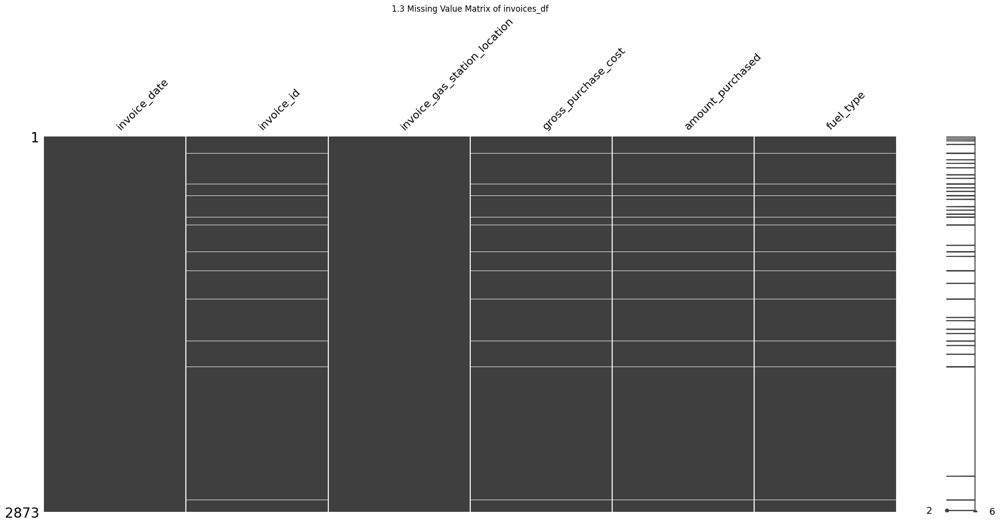

In [ ]:
# 1.3.2 Handle missing values

# check all the rows with NaN values in it
invoices_rows_with_nan = invoices_df[invoices_df.isna().any(axis=1)]
print(invoices_rows_with_nan)
print(f'There are {len(invoices_rows_with_nan)} rows with NaN values in total')

# Run msno Matrix
msno.matrix(invoices_df)
plt.title("1.3 Missing Value Matrix of invoices_df")
plt.savefig("1.3_msno_matrix_of_invoices_df.png", dpi=300, bbox_inches="tight")
plt.show()


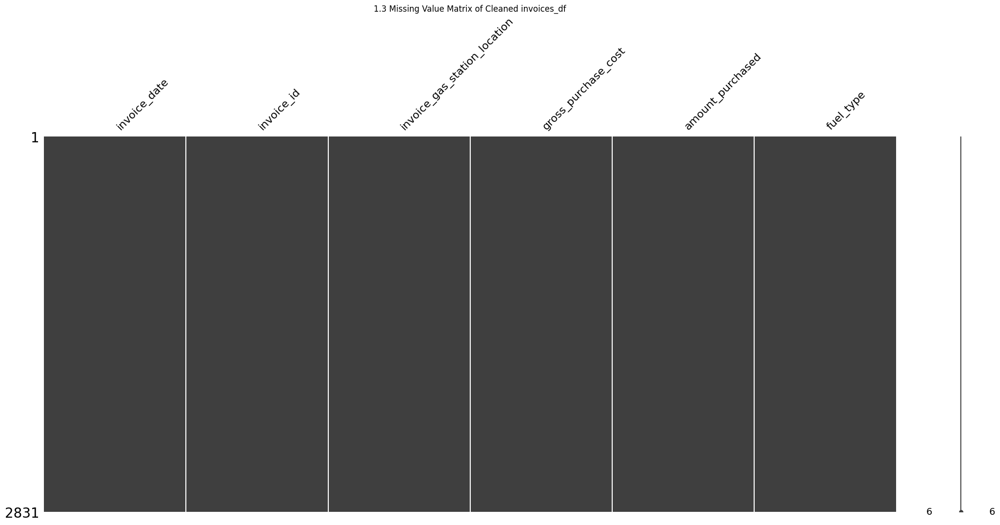

In [ ]:
# Since Costs, Amounts purchased, and fuel types are all missing for these rows
# We can drop all the rows with NaN values
invoices_clean_df = invoices_df.dropna().copy()

# Run msno Matrix
msno.matrix(invoices_clean_df)
plt.title("1.3 Missing Value Matrix of Cleaned invoices_df")
plt.savefig("1.3_msno_matrix_of_invoices_clean_df.png", dpi=300, bbox_inches="tight")
plt.show()

In [ ]:
# 1.3.3 explore the dataset

# check duplicates
print(f'1. The are {invoices_clean_df.duplicated().sum()} duplicated lines in this cleared dataframe')

# check time period
print(f"""
2. The time period of this dataframe is :
    {invoices_clean_df.sort_values('invoice_date').iloc[0].invoice_date} to {invoices_clean_df.sort_values('invoice_date').iloc[-1].invoice_date}
    """)

# check unique()
print(f'3. gas_station_location includes: {invoices_clean_df.invoice_gas_station_location.unique()}')
print()
print(f'4. Fule type includes: {invoices_clean_df.fuel_type.unique()}')
print()
print(f'5. Check if there are no duplicated invoice ids: {invoices_clean_df.invoice_id.nunique() == invoices_clean_df.shape[0]}')

# use value_counts
print(f"""
6. Check the number of invoices for each locations:""")
display(invoices_clean_df.value_counts('invoice_gas_station_location').reset_index().sort_values('invoice_gas_station_location').reset_index(drop=True))

print(f"""
7. Check the number of invoices for each locations and fuel types:""")
display(invoices_clean_df.value_counts(['invoice_gas_station_location', 'fuel_type']).reset_index().sort_values(['invoice_gas_station_location', 'fuel_type']).reset_index(drop=True))

1. The are 0 duplicated lines in this cleared dataframe

2. The time period of this dataframe is :
    2017-01-02 00:00:00 to 2019-08-15 00:00:00
    
3. gas_station_location includes: [1 2 4 5 6 3 7 8]

4. Fule type includes: ['G' 'D']

5. Check if there are no duplicated invoice ids: True

6. Check the number of invoices for each locations:


,invoice_gas_station_location,count
0,1,1361
1,2,632
2,3,80
3,4,356
4,5,280
5,6,42
6,7,52
7,8,28



7. Check the number of invoices for each locations and fuel types:


,invoice_gas_station_location,fuel_type,count
0,1,D,599
1,1,G,762
2,2,D,347
3,2,G,285
4,3,D,41
5,3,G,39
6,4,D,184
7,4,G,172
8,5,D,125
9,5,G,155


<class 'pandas.core.frame.DataFrame'>
Index: 2831 entries, 0 to 2872
Data columns (total 6 columns):
 #   Column                        Non-Null Count  Dtype         
---  ------                        --------------  -----         
 0   invoice_date                  2831 non-null   datetime64[ns]
 1   invoice_id                    2831 non-null   float64       
 2   invoice_gas_station_location  2831 non-null   int64         
 3   gross_purchase_cost           2831 non-null   float64       
 4   amount_purchased              2831 non-null   float64       
 5   fuel_type                     2831 non-null   object        
dtypes: datetime64[ns](1), float64(3), int64(1), object(1)
memory usage: 154.8+ KB


None

,invoice_date,invoice_id,invoice_gas_station_location,gross_purchase_cost,amount_purchased
count,2831,2831.00,2831.00,2831.00,2831.00
mean,2018-04-09 13:01:48.089014528,11415.00,2.31,11762.18,10270.82
min,2017-01-02 00:00:00,10000.00,1.00,94.64,96.98
25%,2017-08-09 00:00:00,10707.50,1.00,8327.90,7073.38
50%,2018-04-06 00:00:00,11415.00,2.00,10459.09,9262.30
75%,2018-11-28 00:00:00,12122.50,4.00,12518.35,11435.98
max,2019-08-15 00:00:00,12830.00,8.00,33118.55,33826.56
std,NaN,817.38,1.69,6562.63,6101.91


,invoice_date,invoice_id,invoice_gas_station_location,gross_purchase_cost,amount_purchased,fuel_type
count,2831,2831.00,2831.00,2831.00,2831.00,2831
unique,NaN,NaN,NaN,NaN,NaN,2
top,NaN,NaN,NaN,NaN,NaN,G
freq,NaN,NaN,NaN,NaN,NaN,1511
mean,2018-04-09 13:01:48.089014528,11415.00,2.31,11762.18,10270.82,NaN
min,2017-01-02 00:00:00,10000.00,1.00,94.64,96.98,NaN
25%,2017-08-09 00:00:00,10707.50,1.00,8327.90,7073.38,NaN
50%,2018-04-06 00:00:00,11415.00,2.00,10459.09,9262.30,NaN
75%,2018-11-28 00:00:00,12122.50,4.00,12518.35,11435.98,NaN
max,2019-08-15 00:00:00,12830.00,8.00,33118.55,33826.56,NaN


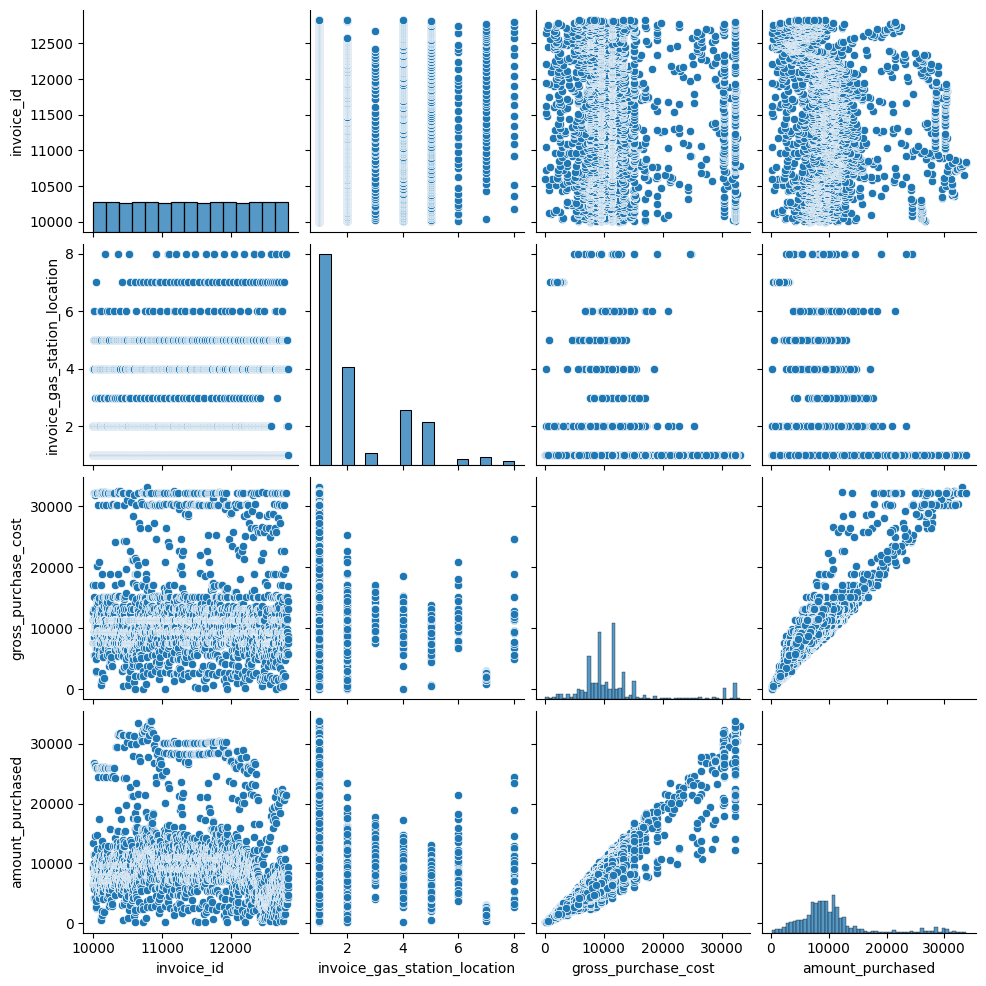

In [ ]:
# 1.3.4 Description analysis
display(invoices_clean_df.info())
display(invoices_clean_df.describe())
display(invoices_clean_df.describe(include = 'all'))

fig_pairplot_invoice = sns.pairplot(invoices_clean_df)
fig_pairplot_invoice.savefig("1.4 Pairplot for Invoices.png", dpi=300)
plt.show()

## 1.4 Fuel Levels

In [ ]:
# 1.4.1 Clear and concat the dataset

# rename column names
fuel_level_part1_df.rename(columns={"Tank ID": "tank_id",
                                    "Fuel Level": "fuel_level",
                                    "Time stamp": "timestamp"
                                   }, inplace=True)

fuel_level_part2_df.rename(columns={"Tank ID": "tank_id",
                                    "Fuel_Level": "fuel_level",
                                    "Timestamp": "timestamp"
                                   }, inplace=True)

# change date to datetime
fuel_level_part1_df["timestamp"] = pd.to_datetime(fuel_level_part1_df["timestamp"])
fuel_level_part2_df["timestamp"] = pd.to_datetime(fuel_level_part2_df["timestamp"])

# # Delete all the spaces in tank_id column
fuel_level_part1_df['tank_id'] = fuel_level_part1_df['tank_id'].astype(str).str.replace(' ', '')
fuel_level_part2_df['tank_id'] = fuel_level_part2_df['tank_id'].astype(str).str.replace(' ', '')

# Concat two dataframe
fuel_level_df = pd.concat([fuel_level_part1_df, fuel_level_part2_df], ignore_index=True)

    tank_id  fuel_level           timestamp
3       T12         NaN 2017-01-01 00:45:00
111     T12         NaN 2017-01-02 03:35:00
There are 2 rows with NaN values in total


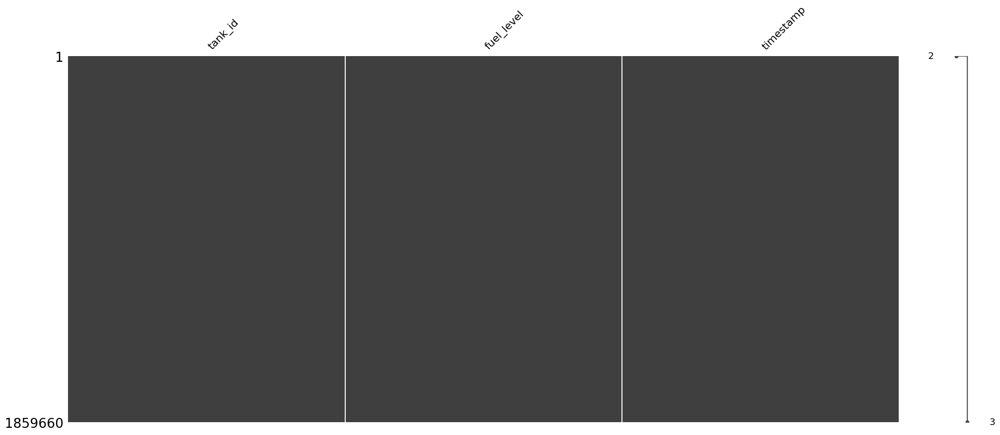

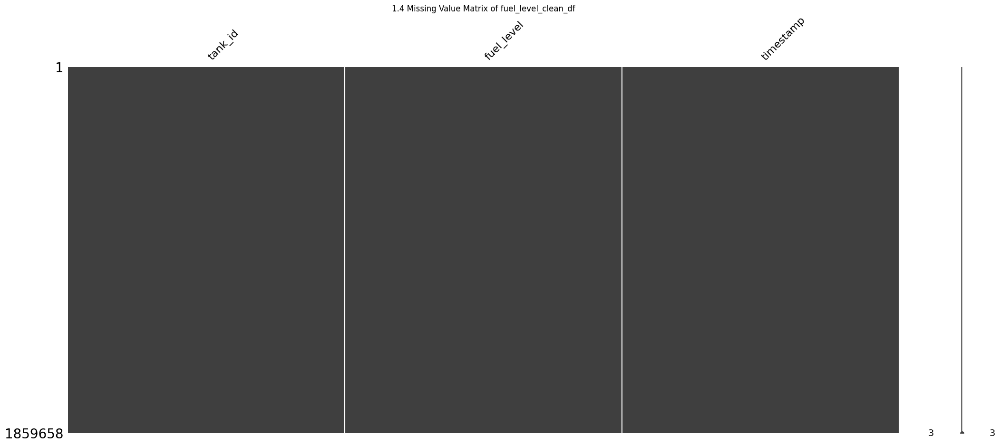

In [ ]:
# 1.4.2 handle missing values

# check all the rows with NaN values in it
msno.matrix(fuel_level_df)
fuel_level_rows_with_nan = fuel_level_df[fuel_level_df.isna().any(axis=1)]
print(fuel_level_rows_with_nan)
print(f'There are {len(fuel_level_rows_with_nan)} rows with NaN values in total')

# Since fuel levels are missing for these rows
# We can drop all the rows with NaN values
fuel_level_clean_df = fuel_level_df.dropna()
msno.matrix(fuel_level_clean_df)
plt.title("1.4 Missing Value Matrix of fuel_level_clean_df")
plt.savefig("1.4_msno_matrix_of_fuel_level_clean_df.png", dpi=300, bbox_inches="tight")
plt.show()

In [ ]:
# 1.4.3 explore this dataset

# check duplicates
print(f'1. The are {fuel_level_clean_df.duplicated().sum()} duplicated lines in this cleared dataframe')

# check time period
print(f"""
2. The time period of this dataframe is :
    {fuel_level_clean_df.sort_values('timestamp').iloc[0].timestamp} to {fuel_level_clean_df.sort_values('timestamp').iloc[-1].timestamp}
    """)

# check unique()
print(f'3. There are {fuel_level_clean_df.tank_id.nunique()} different tank IDs: {fuel_level_clean_df.tank_id.unique()}')

# use value_counts
print(f"""
4. Check the number of datas for each tanks:""")
display(fuel_level_clean_df.value_counts('tank_id').reset_index().sort_values('tank_id').reset_index(drop = True))

1. The are 71 duplicated lines in this cleared dataframe

2. The time period of this dataframe is :
    2017-01-01 00:05:00 to 2019-08-15 23:59:00
    
3. There are 23 different tank IDs: ['T12' 'T13' 'T15' 'T17' 'T19' 'T21' 'T23' 'T24' 'T28' 'T30' 'T31' 'T32'
 'T20' 'T10' 'T11' 'T14' 'T25' 'T16' 'T27' 'T26' 'T22' 'T18' 'T29']

4. Check the number of datas for each tanks:


,tank_id,count
0,T10,83930
1,T11,83856
2,T12,83799
3,T13,83745
4,T14,83515
5,T15,83693
6,T16,87256
7,T17,87257
8,T18,87253
9,T19,87244


<class 'pandas.core.frame.DataFrame'>
Index: 1859658 entries, 0 to 1859659
Data columns (total 3 columns):
 #   Column      Dtype         
---  ------      -----         
 0   tank_id     object        
 1   fuel_level  float64       
 2   timestamp   datetime64[ns]
dtypes: datetime64[ns](1), float64(1), object(1)
memory usage: 56.8+ MB


None

,fuel_level,timestamp
count,1.86e+06,1859658
mean,2.56e+04,2018-05-01 22:14:24.213032704
min,1.48e+03,2017-01-01 00:05:00
25%,1.83e+04,2017-08-23 09:59:00
50%,2.49e+04,2018-04-16 16:31:00
75%,3.04e+04,2019-01-07 09:43:00
max,6.95e+04,2019-08-15 23:59:00
std,1.40e+04,NaN


,tank_id,fuel_level,timestamp
count,1859658,1.86e+06,1859658
unique,23,NaN,NaN
top,T17,NaN,NaN
freq,87257,NaN,NaN
mean,NaN,2.56e+04,2018-05-01 22:14:24.213032704
min,NaN,1.48e+03,2017-01-01 00:05:00
25%,NaN,1.83e+04,2017-08-23 09:59:00
50%,NaN,2.49e+04,2018-04-16 16:31:00
75%,NaN,3.04e+04,2019-01-07 09:43:00
max,NaN,6.95e+04,2019-08-15 23:59:00


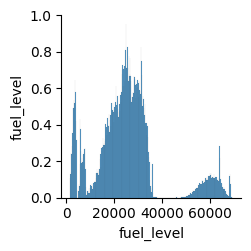

In [ ]:
# 1.4.4 Description Analysis
display(fuel_level_clean_df.info())
display(fuel_level_clean_df.describe())
display(fuel_level_clean_df.describe(include = 'all'))

fig_pairplot_fuel_level = sns.pairplot(fuel_level_clean_df)
fig_pairplot_fuel_level.savefig("1.4 Pairplot for Fuel Levels.png", dpi=300)
plt.show()

# 2. Overall Analysis

## 2.1 Tank Capacity and Location Overview

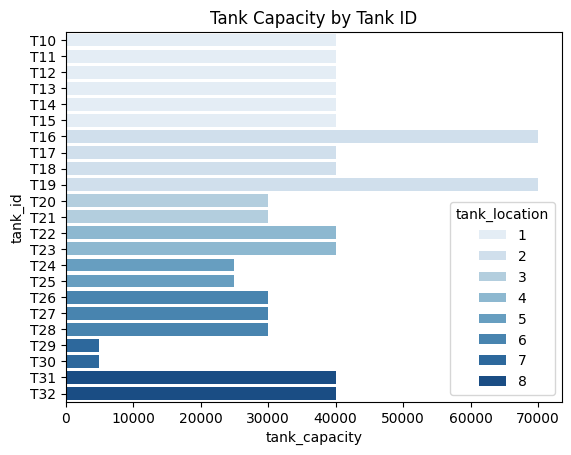

In [ ]:
sns.barplot(data=tanks_df,
            x='tank_capacity',
            y='tank_id',
            hue='tank_location',
            palette=sns.color_palette("Blues", n_colors=8))

plt.title('Tank Capacity by Tank ID')
plt.savefig('2.1 tank_capacity_by_tank_id.png')
plt.show()

## 2.2 Discount

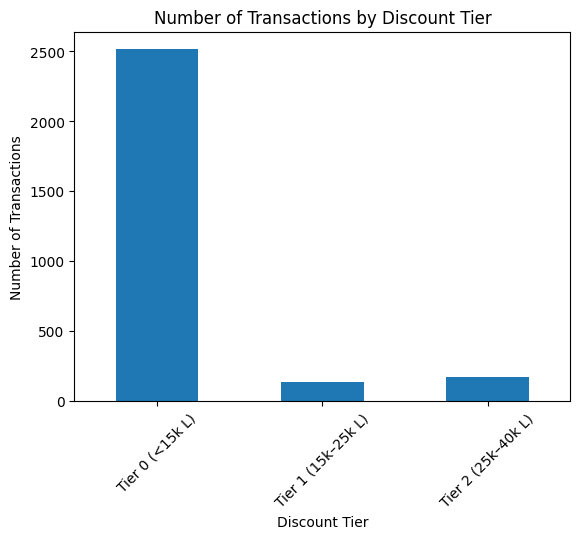

In [ ]:
# Extract month and weekday
invoices_clean_df["month"] = invoices_clean_df["invoice_date"].dt.to_period("M")
invoices_clean_df["day_of_week"] = invoices_clean_df["invoice_date"].dt.day_name()

# Price per liter
invoices_clean_df["price_per_liter"] = (invoices_clean_df["gross_purchase_cost"] / invoices_clean_df["amount_purchased"])

# Categorize transactions by discount tier
def discount_tier(liters):
    """
    Categorize transactions by discount tier
    """
    if liters < 15000:
        return 'Tier 0 (<15k L)'
    elif liters < 25000:
        return 'Tier 1 (15k–25k L)'
    elif liters < 40000:
        return 'Tier 2 (25k–40k L)'
    else:
        return 'Tier 3 (40k+ L)'

invoices_clean_df['discount_tier'] = invoices_clean_df['amount_purchased'].apply(discount_tier)

# Count transactions per tier
tier_counts = invoices_clean_df['discount_tier'].value_counts().sort_index()

# Plot
tier_counts.plot(kind='bar')
plt.title('Number of Transactions by Discount Tier')
plt.xlabel('Discount Tier')
plt.ylabel('Number of Transactions')
plt.xticks(rotation=45)

plt.savefig('2.2 number_of_transactions_by_discount_tier.png')
plt.show()

## 2.3 Missed Opportunities for Discounts

In [ ]:
# Identify orders within 10% of next discount
near1 = invoices_clean_df[(invoices_clean_df['amount_purchased'] >= 13500) & (invoices_clean_df['amount_purchased'] < 15000)]
near2 = invoices_clean_df[(invoices_clean_df['amount_purchased'] >= 22500) & (invoices_clean_df['amount_purchased'] < 25000)]
near3 = invoices_clean_df[(invoices_clean_df['amount_purchased'] >= 36000) & (invoices_clean_df['amount_purchased'] < 40000)]

print(f"Near Tier 1 (13.5k-15k L): {len(near1)} orders")
print(f"Near Tier 2 (22.5k-25k L): {len(near2)} orders")
print(f"Near Tier 3 (36k-40k L): {len(near3)} orders")

Near Tier 1 (13.5k-15k L): 96 orders
Near Tier 2 (22.5k-25k L): 25 orders
Near Tier 3 (36k-40k L): 0 orders


In [ ]:
# Calculate potential savings if these orders reached next tier
def calculate_missed_savings(df, current_discount, next_discount):
  ''' Calculate extra discount if orders reached next tier and apply it to all three tiers'''
  extra_discount = (next_discount - current_discount) / 100
  return (df['amount_purchased'] * extra_discount).sum()

missed1 = calculate_missed_savings(near1, 0, 2)
missed2 = calculate_missed_savings(near2, 2, 3)
missed3 = calculate_missed_savings(near3, 3, 4)
total_missed = missed1 + missed2 + missed3

print(f"If Tier 1 orders reached 15k L: ${missed1:,.2f}")
print(f"If Tier 2 orders reached 25k L: ${missed2:,.2f}")
print(f"If Tier 3 orders reached 40k L: ${missed3:,.2f}")
print(f"Total missed opportunities: ${total_missed:,.2f}")

If Tier 1 orders reached 15k L: $27,402.66
If Tier 2 orders reached 25k L: $5,956.20
If Tier 3 orders reached 40k L: $0.00
Total missed opportunities: $33,358.85


In [ ]:
# Create a missed savings dictionary
missed_savings = {
    'Near Tier 1 (13.5k–15k L)': missed1,
    'Near Tier 2 (22.5k–25k L)': missed2,
    'Near Tier 3 (36k–40k L)': missed3
}

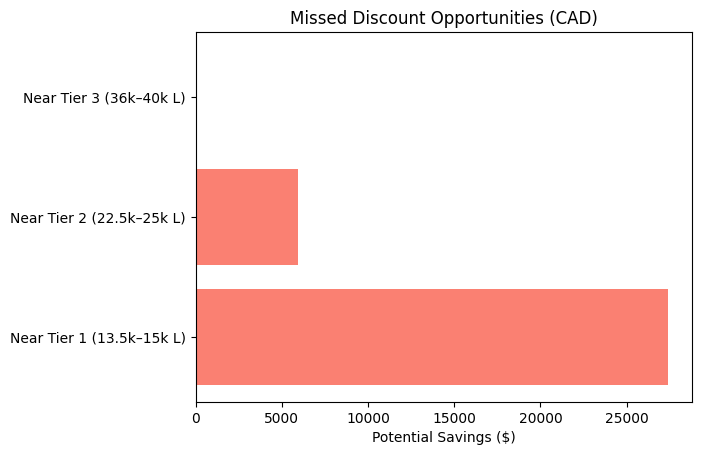

In [ ]:
# Visualize missed savings
plt.barh(list(missed_savings.keys()), list(missed_savings.values()), color='salmon')
plt.title('Missed Discount Opportunities (CAD)')
plt.xlabel('Potential Savings ($)')

plt.savefig('2.3 missed_discount_opportunities.png', dpi = 300, bbox_inches="tight")
plt.show()

## 2.4 Total Average Cost Per Day of the Week

,day_of_week,price_per_liter
0,Saturday,1.07
1,Monday,1.18
2,Thursday,1.19
3,Wednesday,1.20
4,Friday,1.22
5,Tuesday,1.26


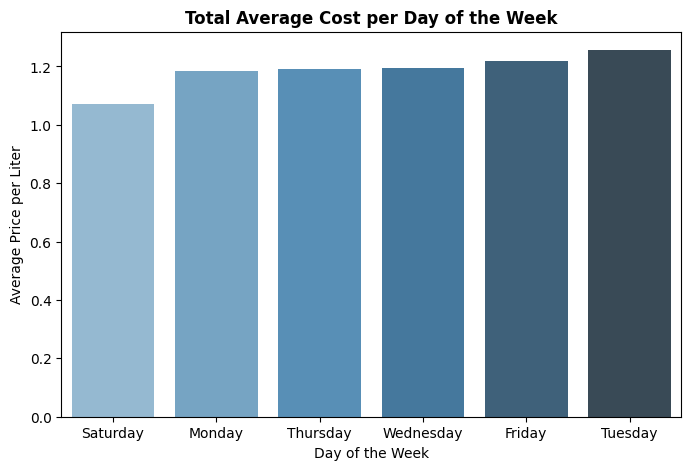

In [ ]:
avg_price_per_day = (invoices_clean_df
                     .groupby("day_of_week")["price_per_liter"]
                     .mean()
                     .sort_values()
                     .reset_index())
display(avg_price_per_day)

# plot
fig,ax = plt.subplots(figsize=(8,5))
ax = sns.barplot(data=avg_price_per_day,
                 x="day_of_week",
                 y="price_per_liter",
                 palette="Blues_d")

ax.set_title("Total Average Cost per Day of the Week", fontweight = 'bold')
ax.set_xlabel("Day of the Week")
ax.set_ylabel("Average Price per Liter")
plt.xticks(rotation=0)
plt.savefig('2.4 total_average_cost_per_day_of_the_week.png')
plt.show()


,day_of_week,price_per_liter
0,Saturday,1.03
1,Monday,1.12
2,Thursday,1.13
3,Wednesday,1.13
4,Friday,1.16
5,Tuesday,1.21


,day_of_week,price_per_liter
0,Saturday,1.10
1,Thursday,1.25
2,Monday,1.25
3,Wednesday,1.25
4,Friday,1.29
5,Tuesday,1.33


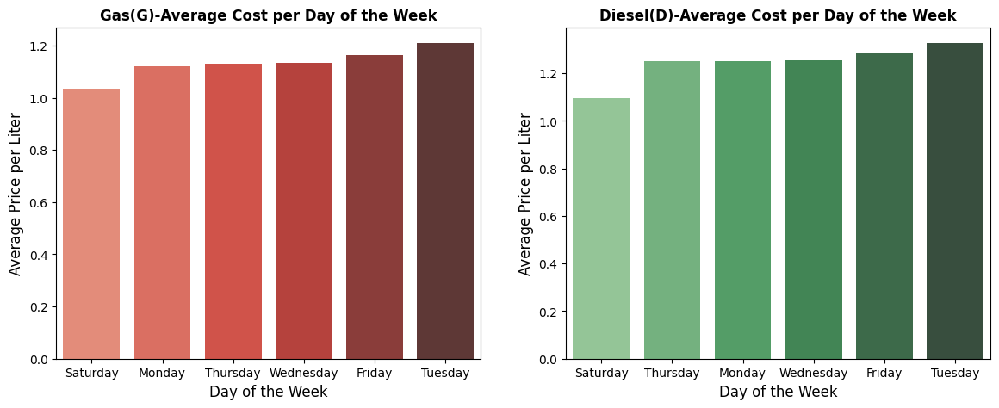

In [ ]:
avg_price_per_day_G = (invoices_clean_df[invoices_clean_df['fuel_type'].eq('G')]
                       .groupby("day_of_week")["price_per_liter"]
                       .mean()
                       .sort_values()
                       .reset_index())
display(avg_price_per_day_G)

avg_price_per_day_D = (invoices_clean_df[invoices_clean_df['fuel_type'].eq('D')]
                       .groupby("day_of_week")["price_per_liter"]
                       .mean()
                       .sort_values()
                       .reset_index())
display(avg_price_per_day_D)

# plot
fig,ax = plt.subplots(nrows = 1, ncols = 2, figsize=(14,5))
sns.barplot(data=avg_price_per_day_G,
            x="day_of_week",
            y="price_per_liter",
            palette="Reds_d",
            ax=ax[0])

ax[0].set_title("Gas(G)-Average Cost per Day of the Week", fontweight='bold')
ax[0].set_xlabel("Day of the Week", fontsize=12)
ax[0].set_ylabel("Average Price per Liter", fontsize=12)

sns.barplot(data=avg_price_per_day_D,
            x="day_of_week",
            y="price_per_liter",
            palette="Greens_d",
            ax=ax[1])
ax[1].set_title("Diesel(D)-Average Cost per Day of the Week", fontweight='bold')
ax[1].set_xlabel("Day of the Week", fontsize=12)
ax[1].set_ylabel("Average Price per Liter", fontsize=12)

plt.xticks(rotation=0)
plt.savefig('2.4 G&D_average_cost_per_day_of_the_week.png')
plt.show()

## 2.5 Average Quantity Purchased by Day of the Week

,day_of_week,amount_purchased
0,Wednesday,9071.29
1,Monday,9081.77
2,Thursday,9175.76
3,Saturday,9673.09
4,Friday,10709.91
5,Tuesday,12771.58


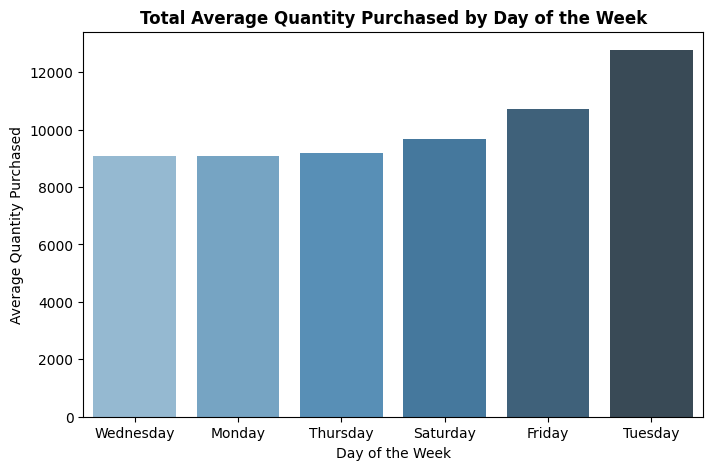

In [ ]:
avg_quantity_per_day = (invoices_clean_df
                        .groupby("day_of_week")["amount_purchased"]
                        .mean()
                        .sort_values()
                        .reset_index())
display(avg_quantity_per_day)

# plot
fig,ax = plt.subplots(figsize=(8,5))
ax = sns.barplot(data=avg_quantity_per_day,
                 x="day_of_week",
                 y="amount_purchased",
                 palette="Blues_d")

ax.set_title("Total Average Quantity Purchased by Day of the Week", fontweight = 'bold')
ax.set_xlabel("Day of the Week")
ax.set_ylabel("Average Quantity Purchased")
plt.xticks(rotation=0)
plt.savefig('2.5 total_average_quantity_purchased_by_day_of_week.png')
plt.show()

,day_of_week,amount_purchased
0,Monday,8840.70
1,Wednesday,9407.93
2,Thursday,9441.54
3,Saturday,10813.43
4,Friday,13155.60
5,Tuesday,15395.06


,day_of_week,amount_purchased
0,Friday,7669.89
1,Wednesday,8758.23
2,Tuesday,8788.22
3,Thursday,8906.81
4,Saturday,8960.39
5,Monday,9336.12


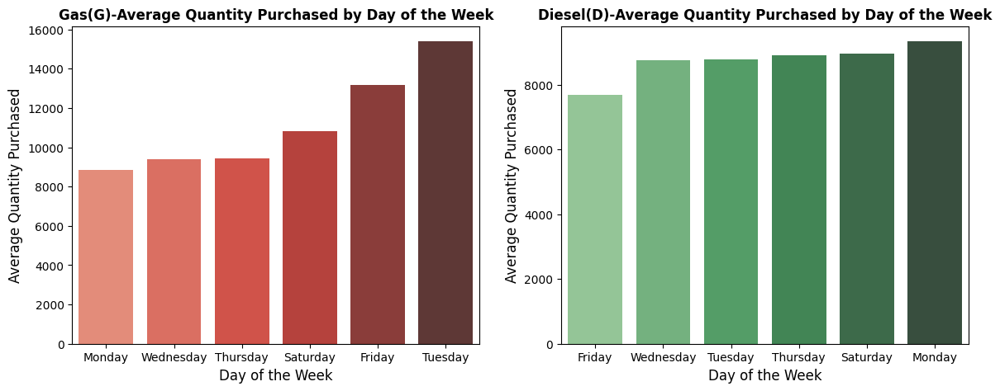

In [ ]:
avg_quantity_per_day_G = (invoices_clean_df[invoices_clean_df['fuel_type'].eq('G')]
                       .groupby("day_of_week")["amount_purchased"]
                       .mean()
                       .sort_values()
                       .reset_index())
display(avg_quantity_per_day_G)

avg_quantity_per_day_D = (invoices_clean_df[invoices_clean_df['fuel_type'].eq('D')]
                       .groupby("day_of_week")["amount_purchased"]
                       .mean()
                       .sort_values()
                       .reset_index())
display(avg_quantity_per_day_D)

# plot
fig,ax = plt.subplots(nrows = 1, ncols = 2, figsize=(14,5))
sns.barplot(data=avg_quantity_per_day_G,
            x="day_of_week",
            y="amount_purchased",
            palette="Reds_d",
            ax=ax[0])

ax[0].set_title("Gas(G)-Average Quantity Purchased by Day of the Week", fontweight='bold')
ax[0].set_xlabel("Day of the Week", fontsize=12)
ax[0].set_ylabel("Average Quantity Purchased", fontsize=12)

sns.barplot(data=avg_quantity_per_day_D,
            x="day_of_week",
            y="amount_purchased",
            palette="Greens_d",
            ax=ax[1])
ax[1].set_title("Diesel(D)-Average Quantity Purchased by Day of the Week", fontweight='bold')
ax[1].set_xlabel("Day of the Week", fontsize=12)
ax[1].set_ylabel("Average Quantity Purchased", fontsize=12)

plt.xticks(rotation=0)
plt.savefig('2.5 G&D_average_quantity_purchased_by_day_of_week.png')
plt.show()

# 3. Station Level Analysis

## 3.1 Average Replenishment Interval & Average Fill Ratio by Gas Station

In [ ]:
# 1. Calculate total tank capacity for each gas station
station_capacity_df = (tanks_df.groupby('tank_location')['tank_capacity']
                       .sum()
                       .reset_index()
                       .rename(columns={'tank_location': 'invoice_gas_station_location',
                                        'tank_capacity': 'total_capacity'}))


# Merge total capacity information into invoice data
invoices_3_1_df = (invoices_clean_df
                   .merge(station_capacity_df, on='invoice_gas_station_location', how='left')
                   .sort_values(by=["invoice_gas_station_location", "invoice_date"]))

# Calculate the previous replenishment date
invoices_3_1_df["prev_date"] = invoices_3_1_df.groupby("invoice_gas_station_location")["invoice_date"].shift(1)

# Calculate the number of days between two replenishments
invoices_3_1_df["days_between"] = (invoices_3_1_df["invoice_date"] - invoices_3_1_df["prev_date"]).dt.days

In [ ]:
# 2. Calculate the average replenishment interval (in days)
avg_interval_df = (invoices_3_1_df
                   .groupby("invoice_gas_station_location")["days_between"]
                   .mean()
                   .reset_index()
                   .rename(columns={"days_between": "avg_replenishment_interval_days"}))

In [ ]:
# 3. Calculate the refill amount as a percentage of tank capacity
invoices_3_1_df["purchase_to_capacity_pct"] = (invoices_3_1_df["amount_purchased"] / invoices_3_1_df["total_capacity"]) * 100

# Calculate the average fill ratio (%) for each gas station
avg_fill_ratio_df = (invoices_3_1_df.groupby("invoice_gas_station_location")["purchase_to_capacity_pct"]
                     .mean()
                     .reset_index()
                     .rename(columns={"purchase_to_capacity_pct": "avg_fill_ratio_pct"}))

In [ ]:
# 4. Calculate potential savings (assuming maximum discount is applied)
def get_discount(liters):
    """
    Return discount (cents per liter) based on purchase volume.
    """
    if liters < 15000:
        return 0
    elif liters < 25000:
        return 2
    elif liters < 40000:
        return 3
    else:
        return 4

# Apply discount rule
invoices_3_1_df["discount_cents"] = invoices_3_1_df["amount_purchased"].apply(get_discount)
invoices_3_1_df["discount_dollars"] = invoices_3_1_df["discount_cents"] / 100
invoices_3_1_df["actual_cost_per_liter"] = invoices_3_1_df["gross_purchase_cost"] / invoices_3_1_df["amount_purchased"]

# Theoretical maximum discount is 4 cents
invoices_3_1_df["optimal_cost_per_liter"] = invoices_3_1_df["actual_cost_per_liter"] - 0.04
invoices_3_1_df["potential_saving_per_liter"] = (invoices_3_1_df["actual_cost_per_liter"] - invoices_3_1_df["optimal_cost_per_liter"])

# Calculate average potential saving per gas station
potential_saving_df = (invoices_3_1_df
                       .groupby("invoice_gas_station_location")["potential_saving_per_liter"]
                       .mean()
                       .reset_index()
                       .rename(columns={"potential_saving_per_liter": "avg_potential_saving_per_liter"}))

In [ ]:
# 5. Summarize analysis results
summary_3_1_df = (avg_interval_df
                  .merge(avg_fill_ratio_df, on="invoice_gas_station_location", how="left")
                  .merge(potential_saving_df, on="invoice_gas_station_location", how="left")
                  .merge(station_capacity_df, on="invoice_gas_station_location", how="left"))

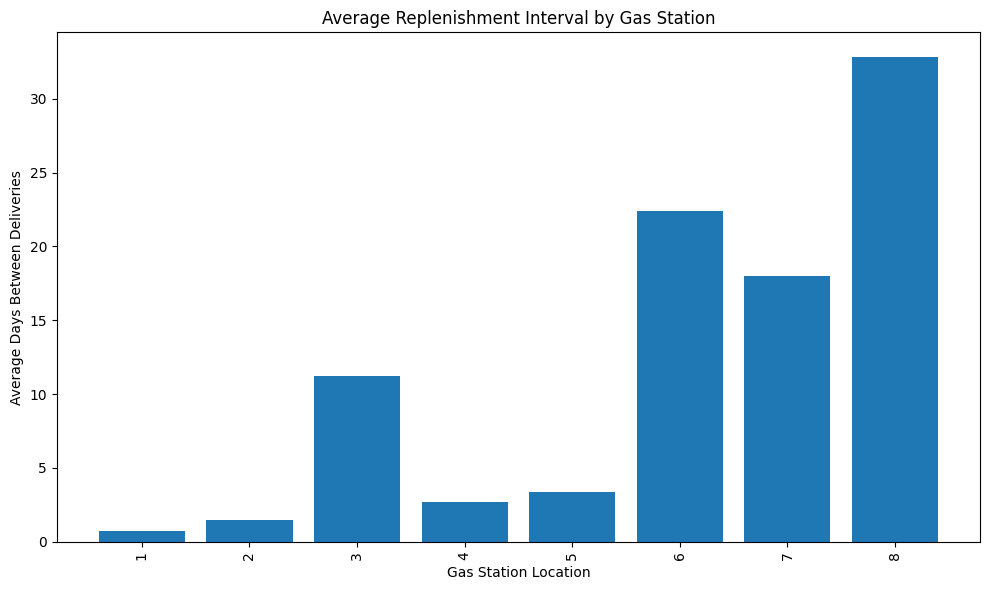

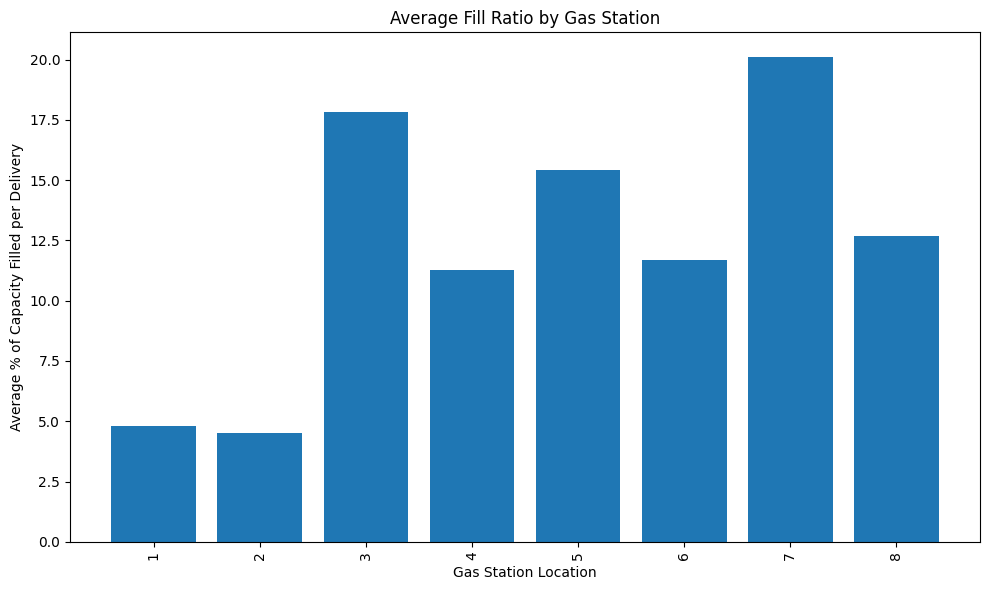

,invoice_gas_station_location,avg_replenishment_interval_days,avg_fill_ratio_pct,avg_potential_saving_per_liter,total_capacity
0,1,0.70,4.82,0.04,240000
1,2,1.51,4.52,0.04,220000
2,3,11.25,17.82,0.04,60000
3,4,2.69,11.27,0.04,80000
4,5,3.40,15.42,0.04,50000
5,6,22.37,11.67,0.04,90000
6,7,18.02,20.12,0.04,10000
7,8,32.85,12.67,0.04,80000


In [ ]:
# 6. Visualization
# Average replenishment interval (days)
plt.figure(figsize=(10, 6))
plt.bar(summary_3_1_df["invoice_gas_station_location"], summary_3_1_df["avg_replenishment_interval_days"])
plt.title("Average Replenishment Interval by Gas Station")
plt.xlabel("Gas Station Location")
plt.ylabel("Average Days Between Deliveries")
plt.xticks(rotation=90)
plt.tight_layout()
plt.savefig('3.1 Average Replenishment Interval by Gas Station.png')
plt.show()

# Average fill ratio (%)
plt.figure(figsize=(10, 6))
plt.bar(summary_3_1_df["invoice_gas_station_location"], summary_3_1_df["avg_fill_ratio_pct"])
plt.title("Average Fill Ratio by Gas Station")
plt.xlabel("Gas Station Location")
plt.ylabel("Average % of Capacity Filled per Delivery")
plt.xticks(rotation=90)
plt.tight_layout()
plt.savefig('3.1 Average Fill Ratio by Gas Station.png')
plt.show()

summary_3_1_df.to_csv('inventory_evaluation_summary.csv', index=False)
summary_3_1_df

## 3.2 Weekly & Monthly Purchase Trends by Gas Station

### 3.2.1 Weekly Trends by Gas Station

In [ ]:
weekly_amount = (invoices_clean_df
                 .set_index('invoice_date')
                 .groupby('invoice_gas_station_location')
                 .resample('W-MON')['amount_purchased']
                 .sum()
                 .reset_index())

station_name_map = {1: 'EastMount',
                    2: 'Eastgate',
                    3: 'Central',
                    4: 'Chedoke',
                    5: 'Mountain View',
                    6: 'Oakville',
                    7: 'Circle',
                    8: 'Chappel'}

weekly_amount['gas_station_name'] = weekly_amount['invoice_gas_station_location'].map(station_name_map)
display(weekly_amount.head())

,invoice_gas_station_location,invoice_date,amount_purchased,gas_station_name
0,1,2017-01-02,15948.34,EastMount
1,1,2017-01-09,128681.84,EastMount
2,1,2017-01-16,99699.12,EastMount
3,1,2017-01-23,148702.10,EastMount
4,1,2017-01-30,113492.64,EastMount


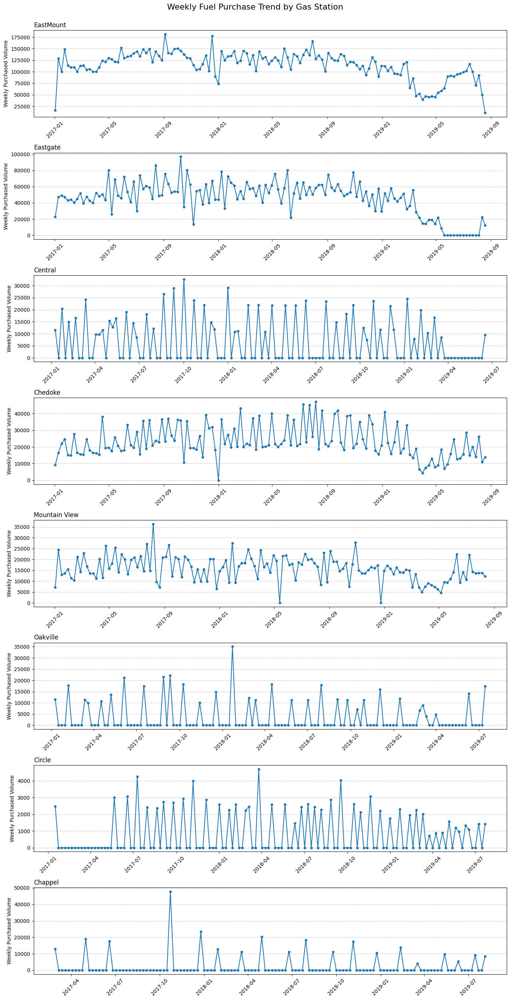

In [ ]:
station_names = weekly_amount['gas_station_name'].unique()

# plot
fig, axes = plt.subplots(nrows=8, ncols=1, figsize=(14, 3.5 * 8))
axes = np.ravel(axes)

plt.suptitle('Weekly Fuel Purchase Trend by Gas Station', fontsize=16, y=0.97)

for i, station in enumerate(station_names):
    ax = axes[i]
    station_data = weekly_amount[weekly_amount['gas_station_name'] == station]

    ax.plot(station_data['invoice_date'], station_data['amount_purchased'], marker='o', linestyle='-', markersize=4)
    ax.set_title(f"{station}", loc='left', fontsize=12)
    ax.set_ylabel('Weekly Purchased Volume', fontsize=10)
    ax.tick_params(axis='x', rotation=45)
    ax.grid(axis='y', linestyle='--', alpha=0.7)

plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.savefig('3.2.1 weekly_purchase_trend_by_station.png')
plt.show()

### 3.2.2 Monthly Trends by Gas Station

In [ ]:
monthly_amount = (invoices_clean_df
                  .set_index('invoice_date')
                  .groupby('invoice_gas_station_location')
                  .resample('M')['amount_purchased']
                  .sum()
                  .reset_index())

monthly_amount['gas_station_name'] = monthly_amount['invoice_gas_station_location'].map(station_name_map)
display(monthly_amount.head())

,invoice_gas_station_location,invoice_date,amount_purchased,gas_station_name
0,1,2017-01-31,532526.54,EastMount
1,1,2017-02-28,441947.04,EastMount
2,1,2017-03-31,471884.90,EastMount
3,1,2017-04-30,480539.31,EastMount
4,1,2017-05-31,579391.34,EastMount


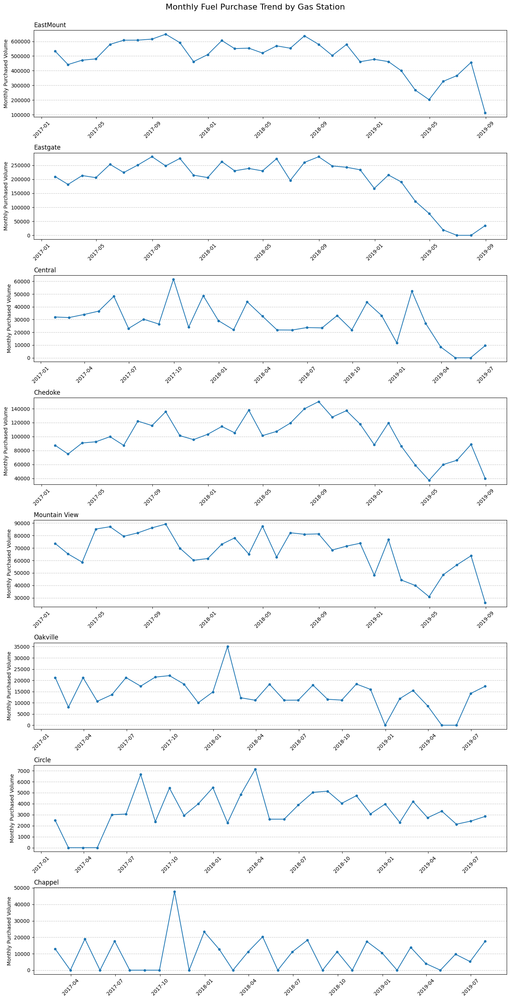

In [ ]:
fig, axes = plt.subplots(nrows=8, ncols=1, figsize=(14, 3.5 * 8))
axes = np.ravel(axes)

plt.suptitle('Monthly Fuel Purchase Trend by Gas Station', fontsize=16, y=0.97)

for i, station in enumerate(station_names):
    ax = axes[i]
    station_data = monthly_amount[monthly_amount['gas_station_name'] == station]

    ax.plot(station_data['invoice_date'], station_data['amount_purchased'], marker='o', linestyle='-', markersize=4)
    ax.set_title(f"{station}", loc='left', fontsize=12)
    ax.set_ylabel('Monthly Purchased Volume', fontsize=10)
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
    ax.tick_params(axis='x', rotation=45)
    ax.grid(axis='y', linestyle='--', alpha=0.7)

plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.savefig('3.2.2 monthly_purchase_trend_by_station.png')
plt.show()

## 3.3 Quantity purchased by day of the week for each gas station

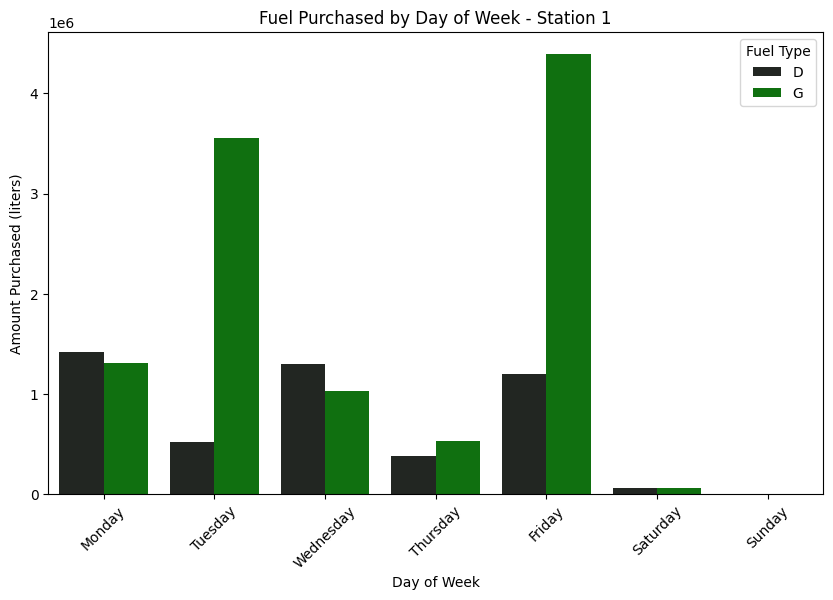

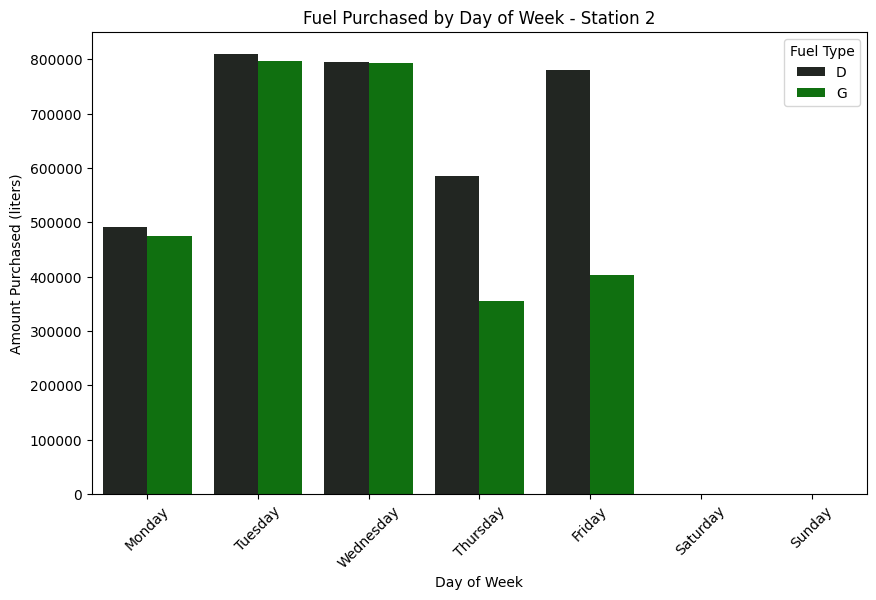

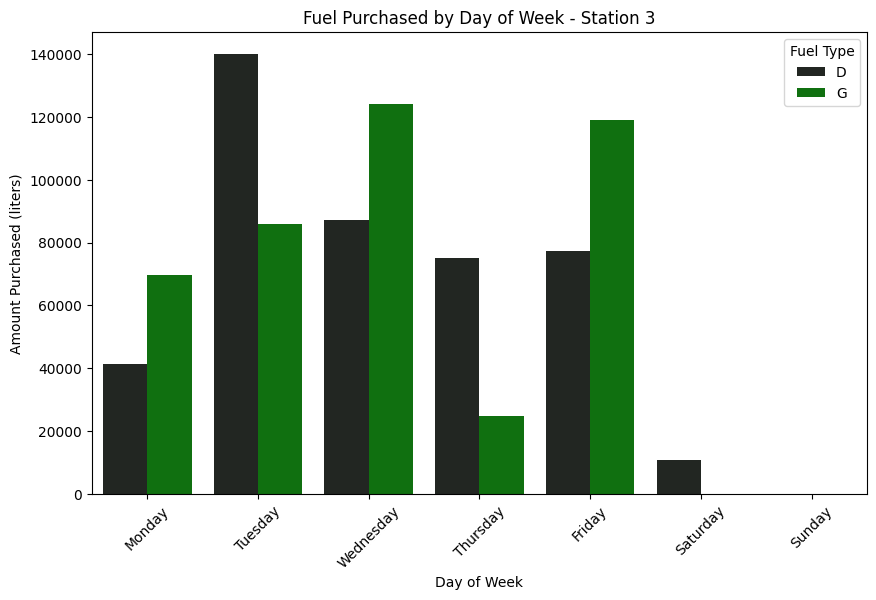

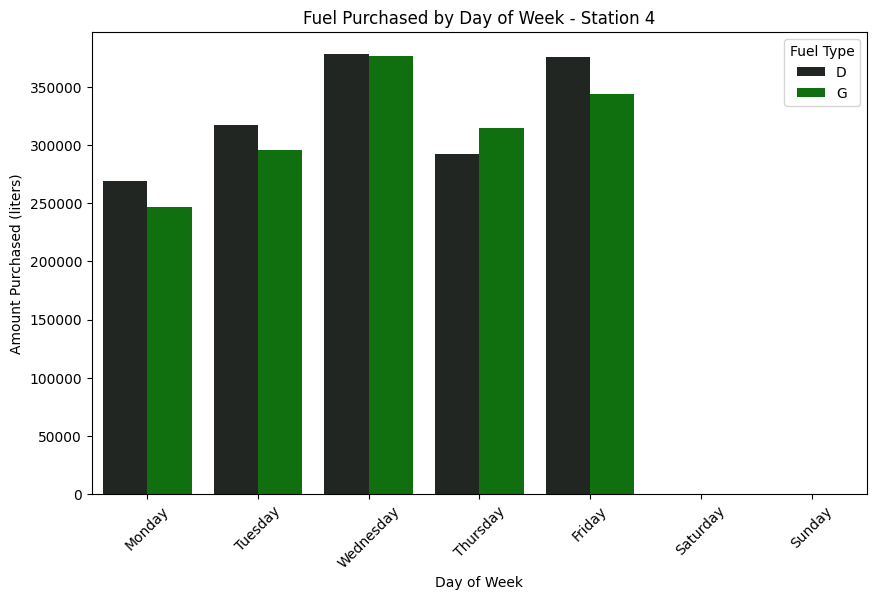

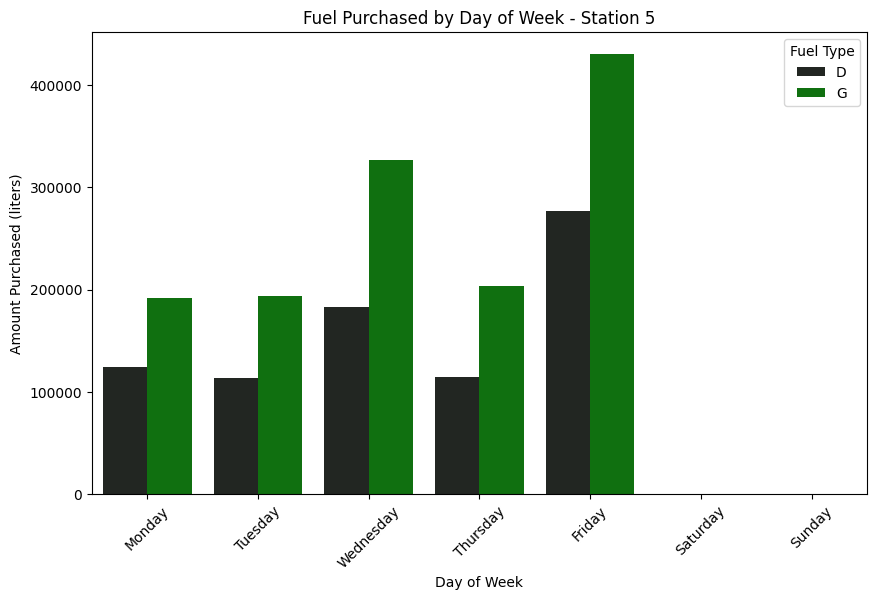

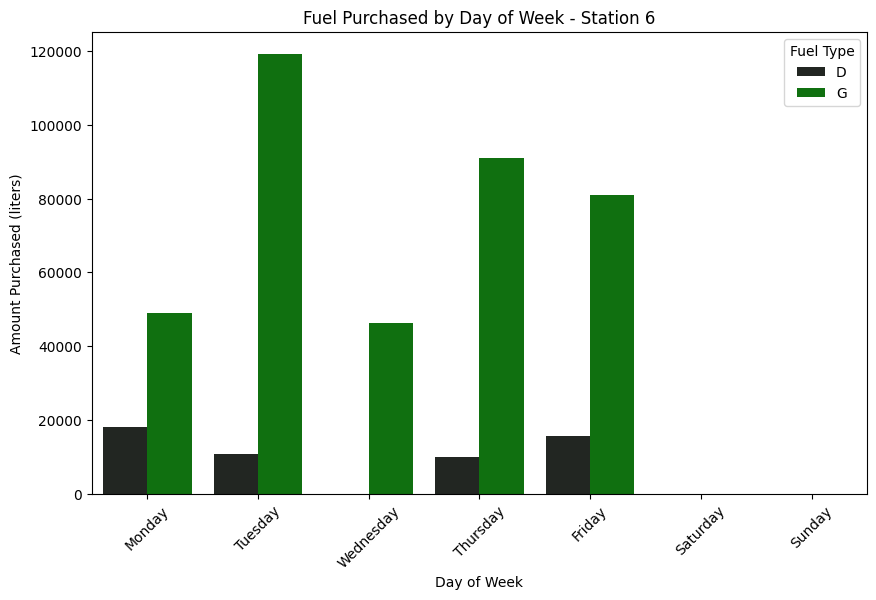

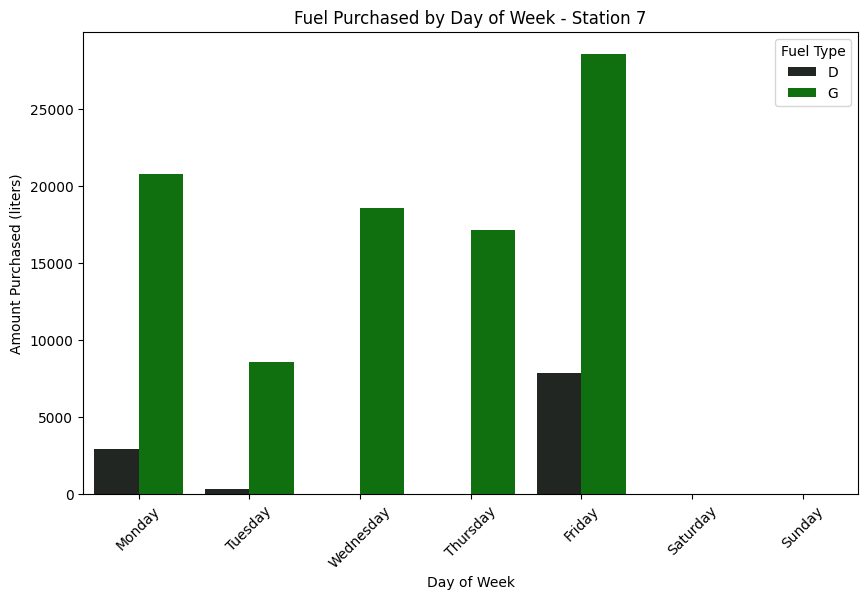

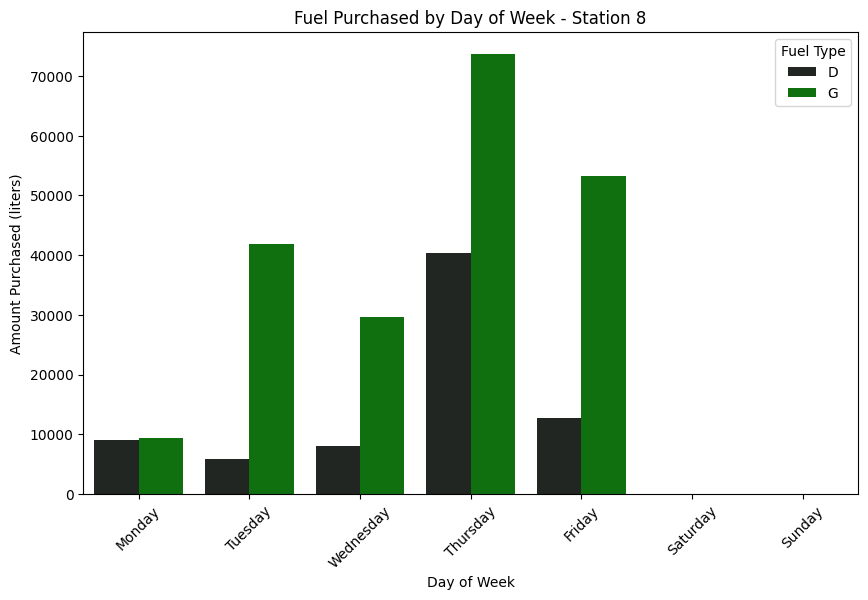

In [ ]:
# Group data by station, day of week, and fuel type
grouped_df = (invoices_clean_df
              .groupby(['invoice_gas_station_location', 'day_of_week', 'fuel_type'])['amount_purchased']
              .sum()
              .reset_index())

# Reorder days
weekday_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
grouped_df['day_of_week'] = pd.Categorical(grouped_df['day_of_week'], categories=weekday_order, ordered=True)

# Plot for each station
for station in grouped_df['invoice_gas_station_location'].unique():
    station_df = grouped_df[grouped_df['invoice_gas_station_location'] == station]

    plt.figure(figsize=(10, 6))
    sns.barplot(data=station_df, x='day_of_week', y='amount_purchased', hue='fuel_type', color = "green")
    plt.title(f'Fuel Purchased by Day of Week - Station {station}')
    plt.xlabel('Day of Week')
    plt.ylabel('Amount Purchased (liters)')
    plt.xticks(rotation=45)
    plt.legend(title='Fuel Type')
    plt.savefig(f'3.3 Fuel Purchased by Day of Week - Station {station}.png', dpi = 300, bbox_inches="tight")
    plt.show();

## 3.4 Average Gross Purchase Cost by Day Analysis

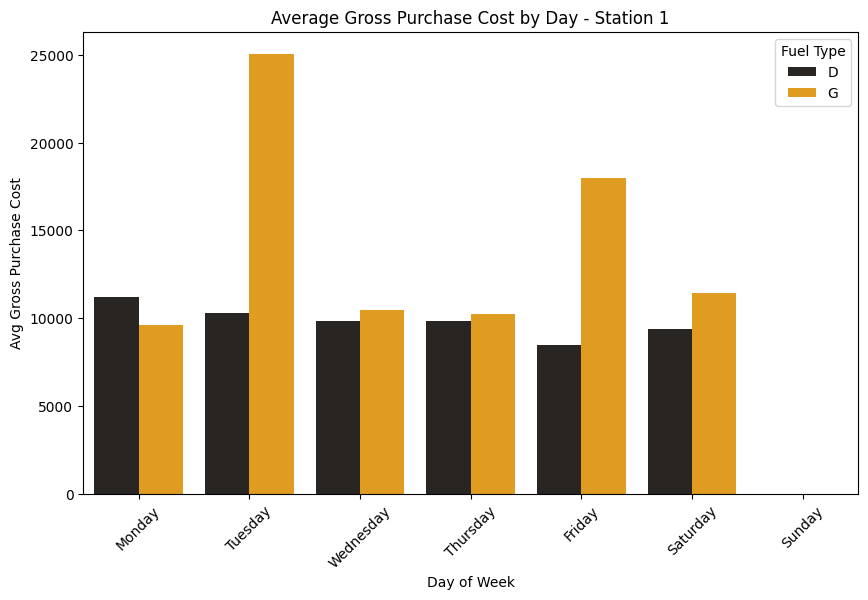

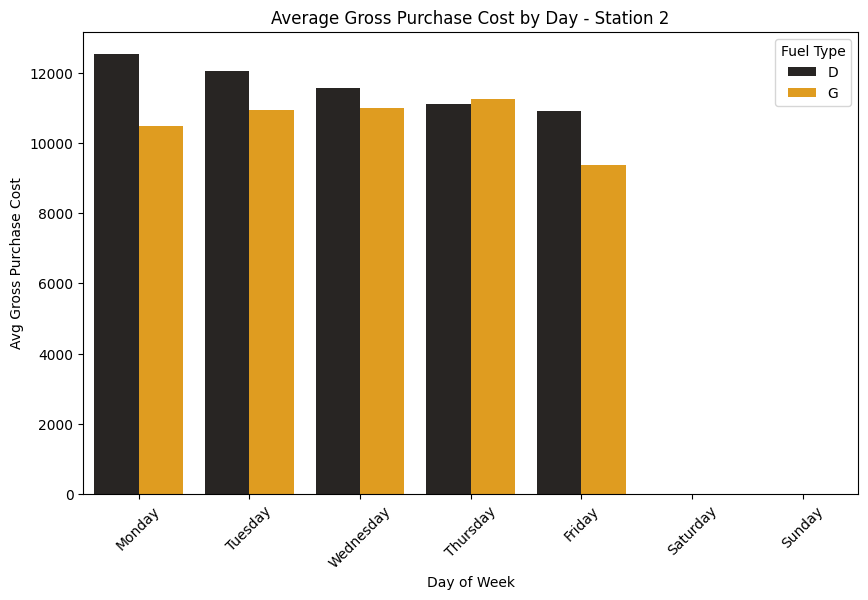

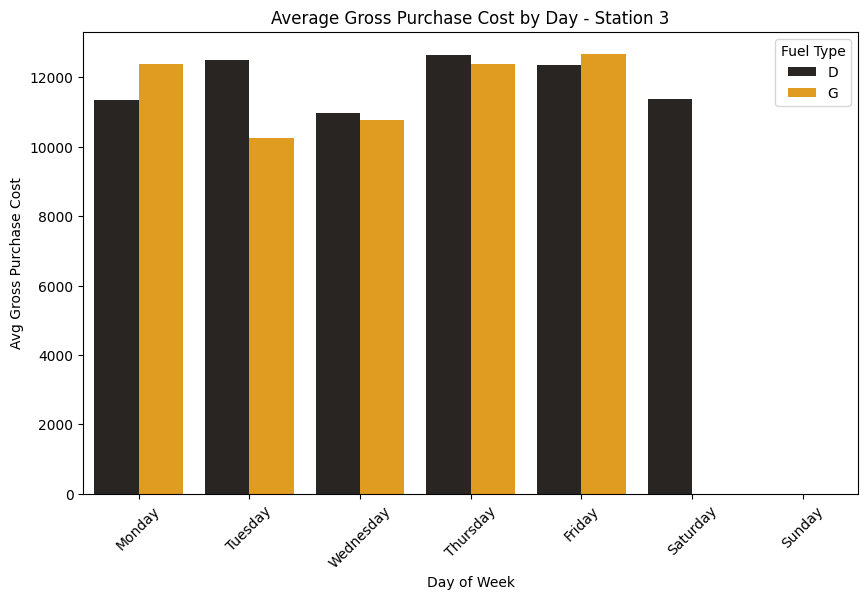

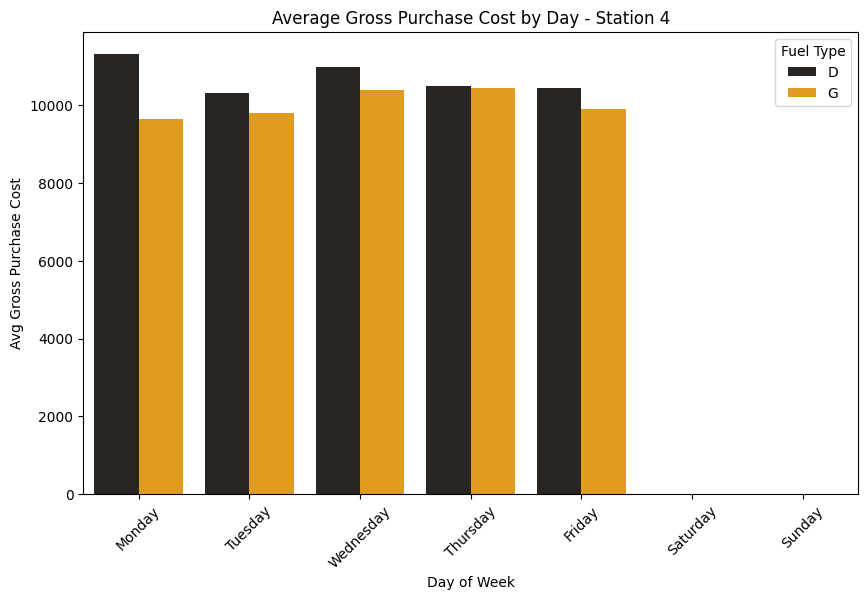

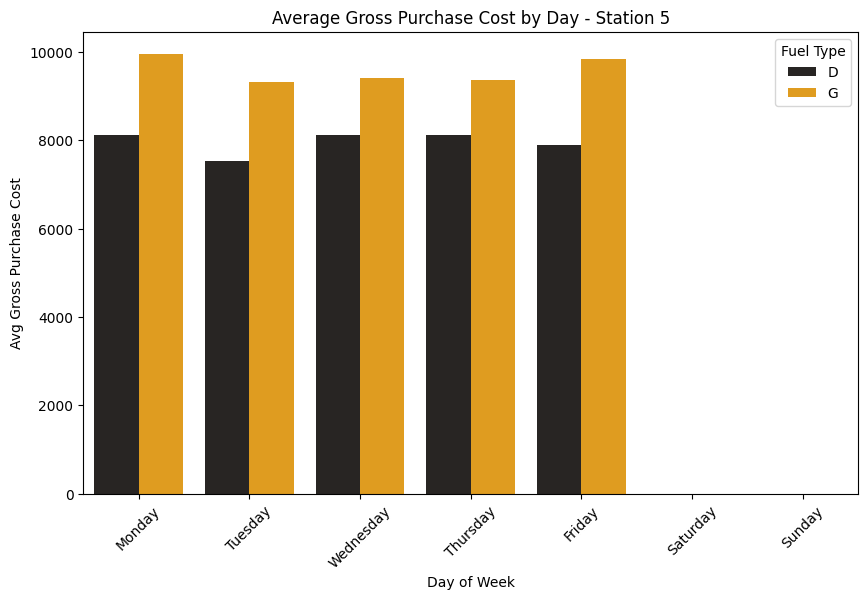

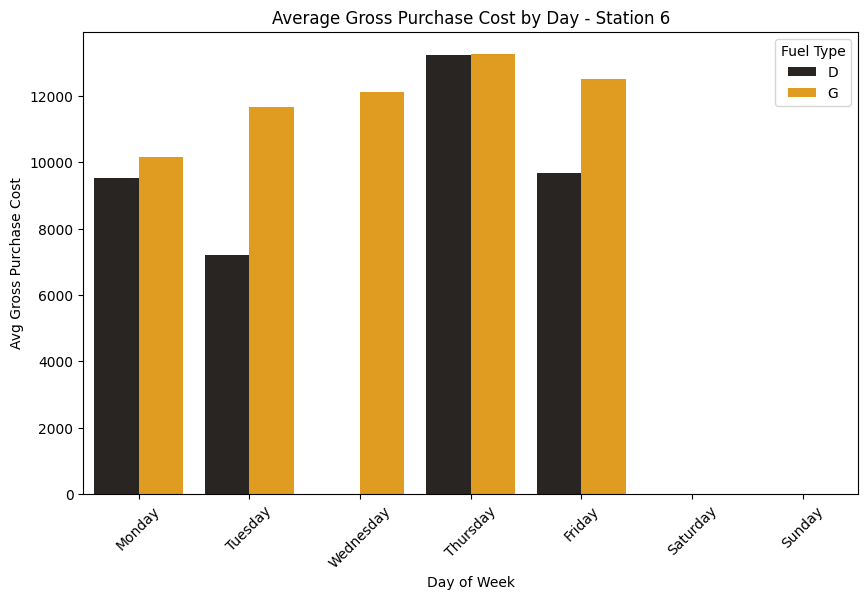

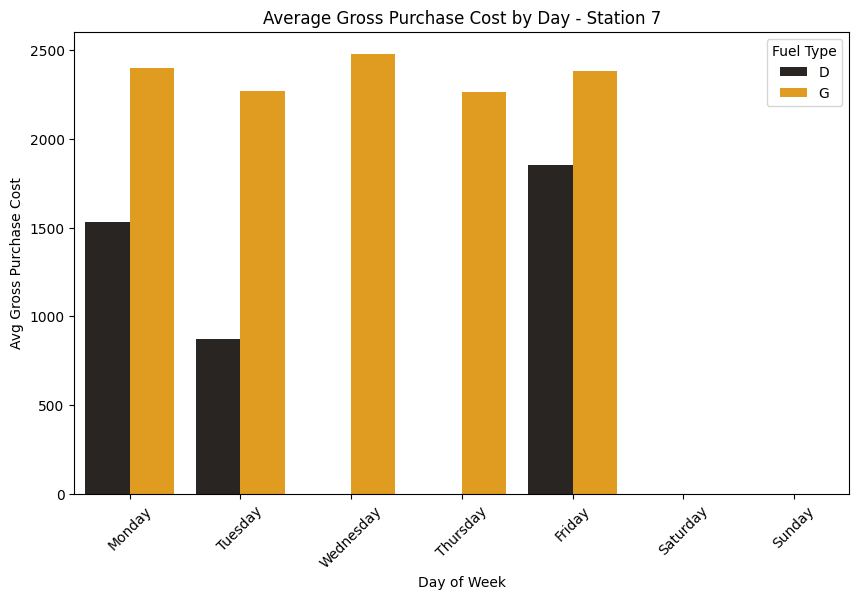

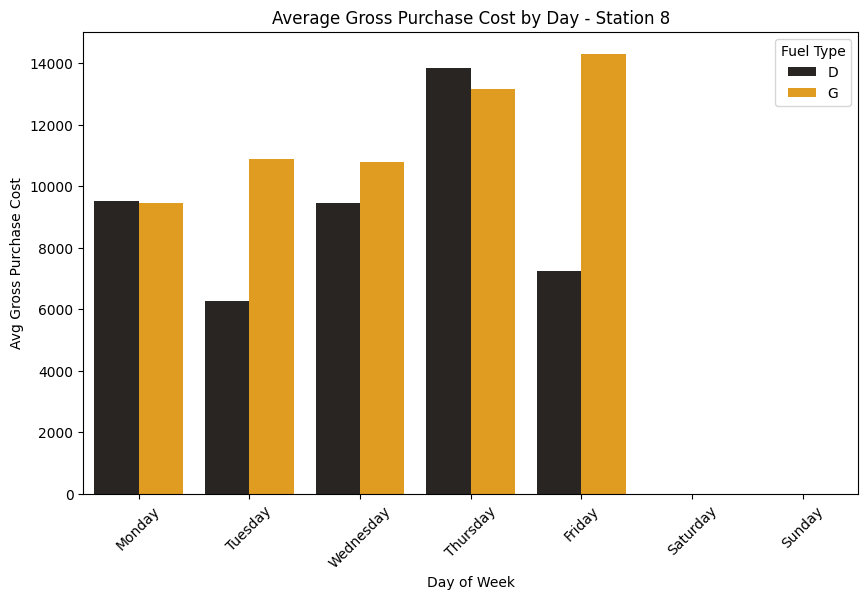

In [ ]:
# Group by station, day of week, and fuel type to get average gross purchase
avg_price_df = (invoices_clean_df
                .groupby(['invoice_gas_station_location', 'day_of_week', 'fuel_type'])['gross_purchase_cost']
                .mean()
                .reset_index())

# Reorder days
weekday_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
avg_price_df['day_of_week'] = pd.Categorical(avg_price_df['day_of_week'], categories=weekday_order, ordered=True)

# Loop through each station and plot
for station in avg_price_df['invoice_gas_station_location'].unique():
    station_df = avg_price_df[avg_price_df['invoice_gas_station_location'] == station]

    plt.figure(figsize=(10, 6))
    sns.barplot(data=station_df, x='day_of_week', y='gross_purchase_cost', hue='fuel_type', color = "orange")
    plt.title(f'Average Gross Purchase Cost by Day - Station {station}')
    plt.xlabel('Day of Week')
    plt.ylabel('Avg Gross Purchase Cost')
    plt.xticks(rotation=45)
    plt.legend(title='Fuel Type')
    plt.savefig(f'3.4 Average Gross Purchased Cost by Day - Station {station}.png', dpi = 300, bbox_inches="tight")
    plt.show()

## 3.5 Price per Liter Average by day of the week

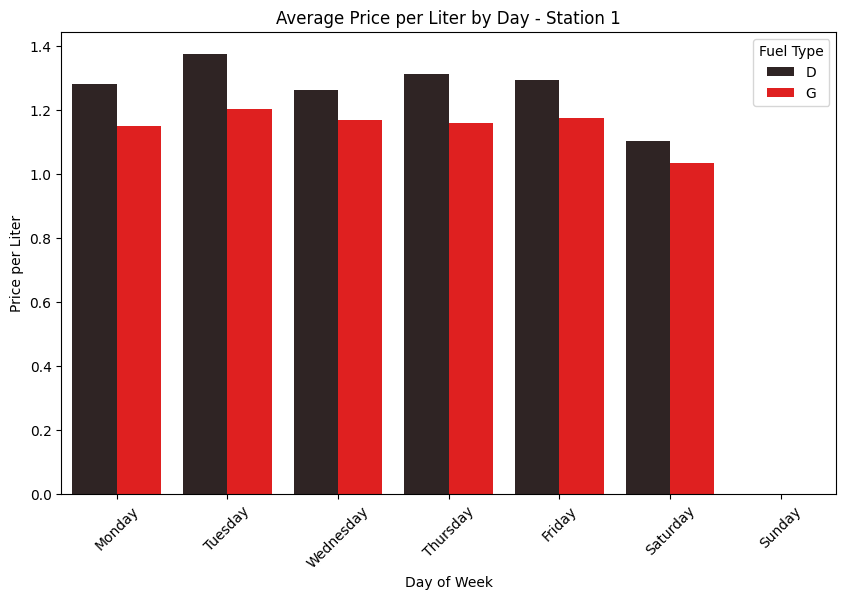

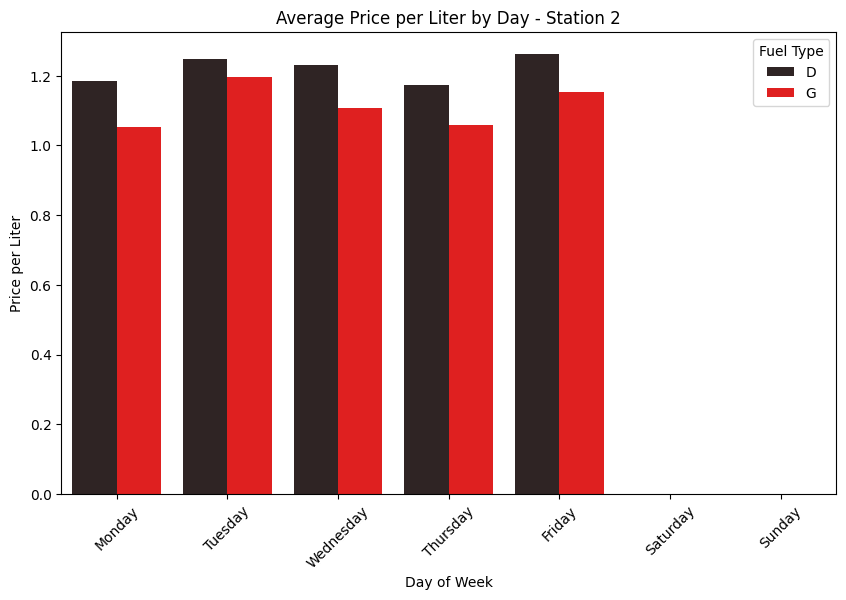

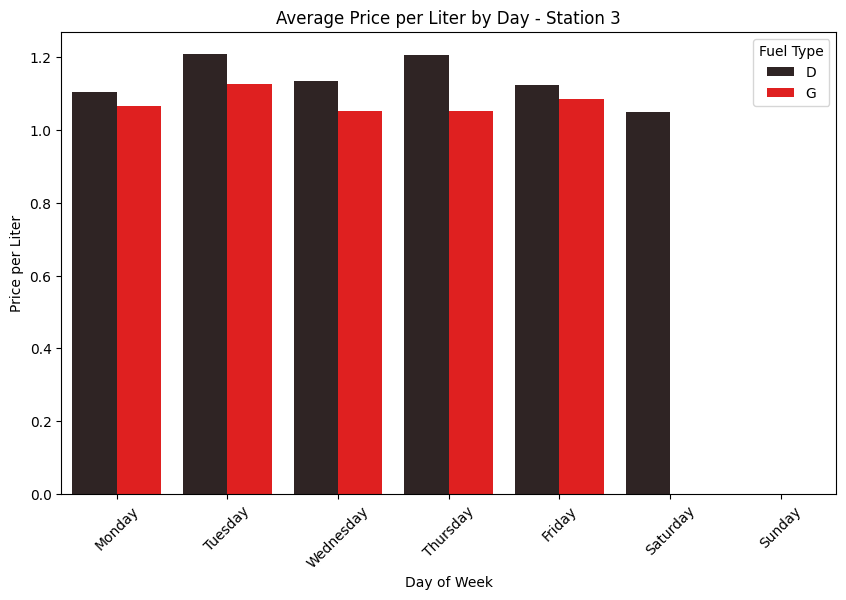

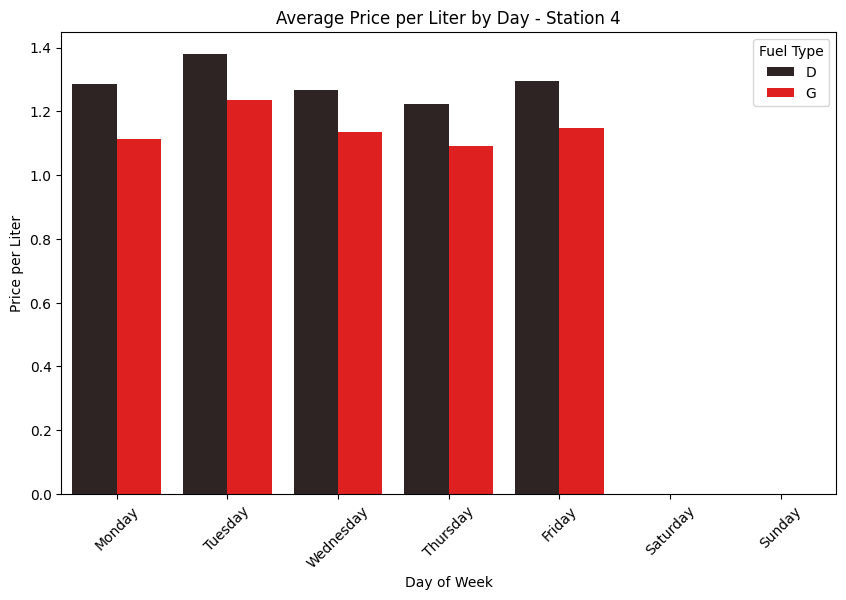

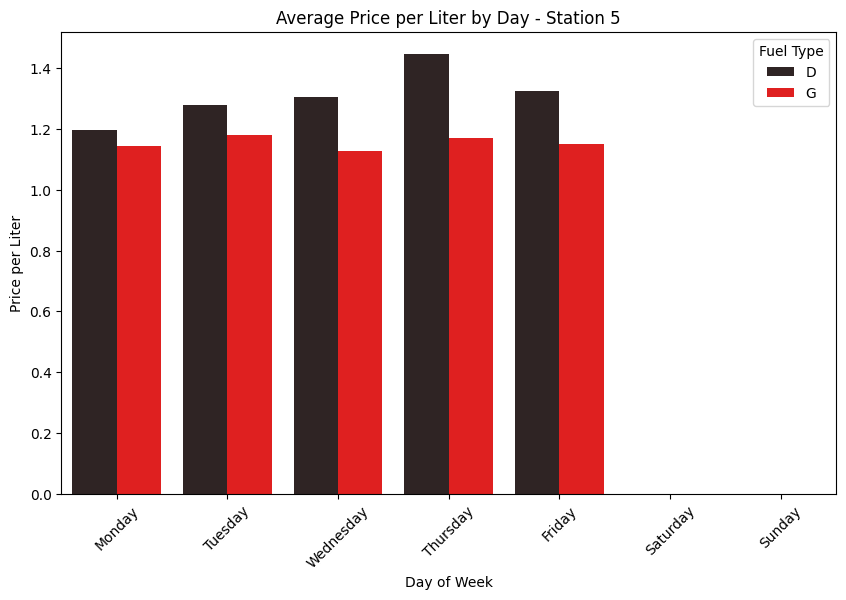

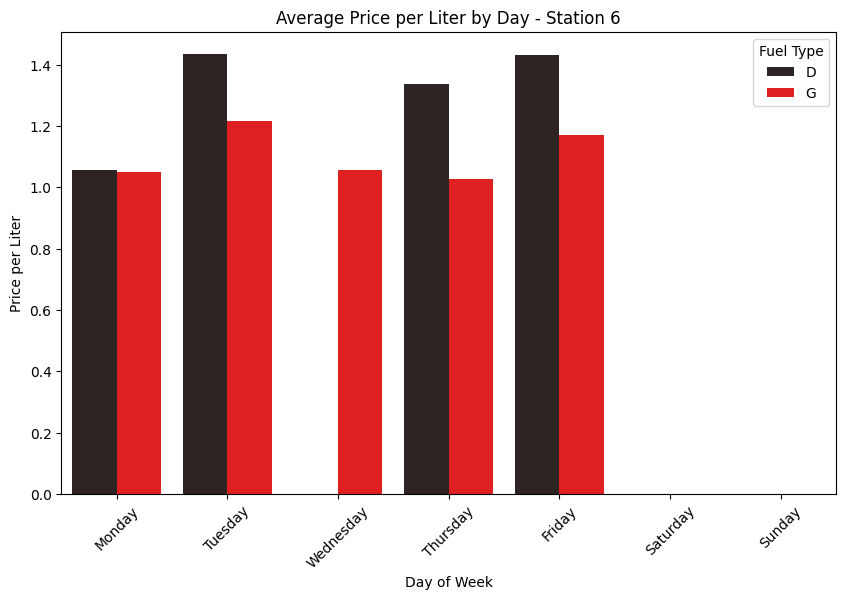

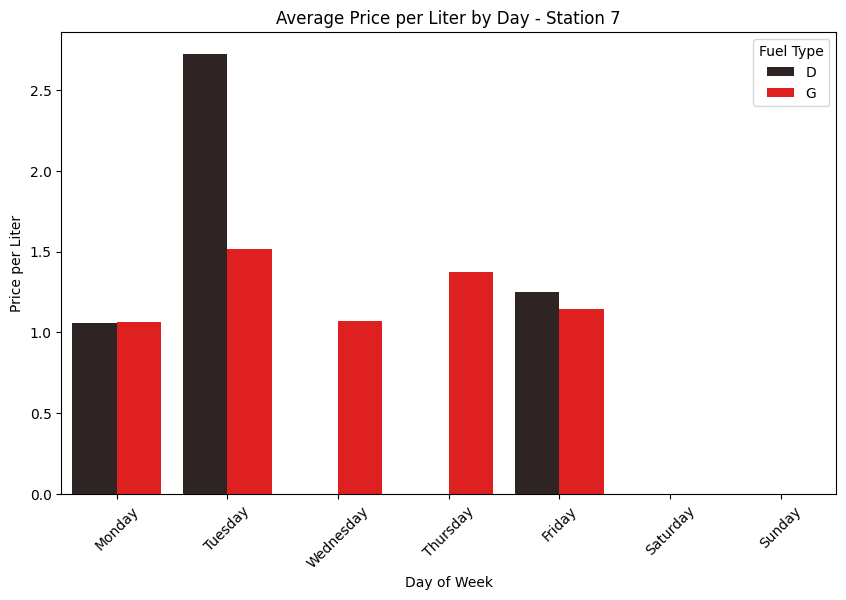

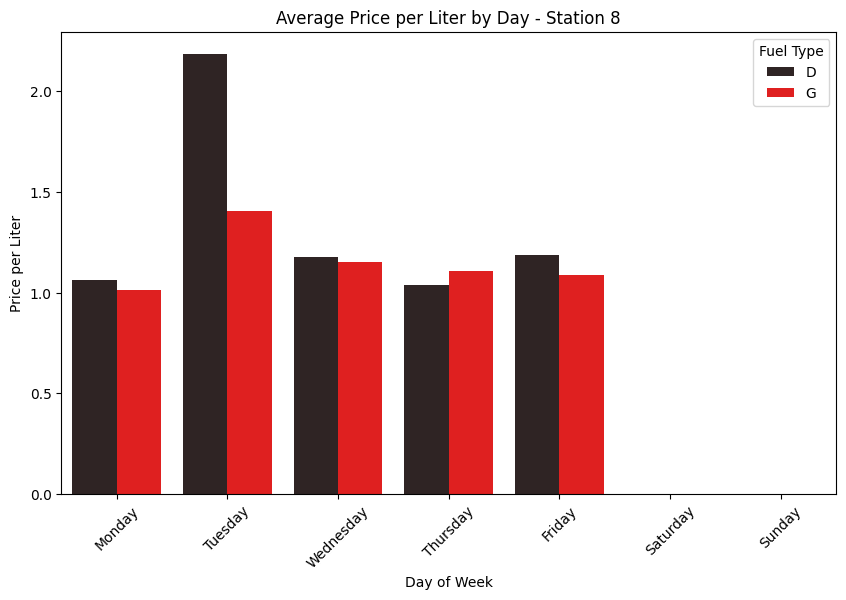

In [ ]:
# Group by station, day of week, and fuel type to get average price per liter
avg_price_df = (invoices_clean_df
                .groupby(['invoice_gas_station_location', 'day_of_week', 'fuel_type'])['price_per_liter']
                .mean()
                .reset_index())

# Reorder days
weekday_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
avg_price_df['day_of_week'] = pd.Categorical(avg_price_df['day_of_week'], categories=weekday_order, ordered=True)

# Loop through each station and plot
for station in avg_price_df['invoice_gas_station_location'].unique():
    station_df = avg_price_df[avg_price_df['invoice_gas_station_location'] == station]

    plt.figure(figsize=(10, 6))
    sns.barplot(data=station_df, x='day_of_week', y='price_per_liter', hue='fuel_type', color = "red")
    plt.title(f'Average Price per Liter by Day - Station {station}')
    plt.xlabel('Day of Week')
    plt.ylabel('Price per Liter')
    plt.xticks(rotation=45)
    plt.legend(title='Fuel Type')
    plt.savefig(f'3.5 Average Price per Liter by Day - Station {station}.png', dpi = 300, bbox_inches="tight")
    plt.show()

## 3.6 Number of invoices by day of the week

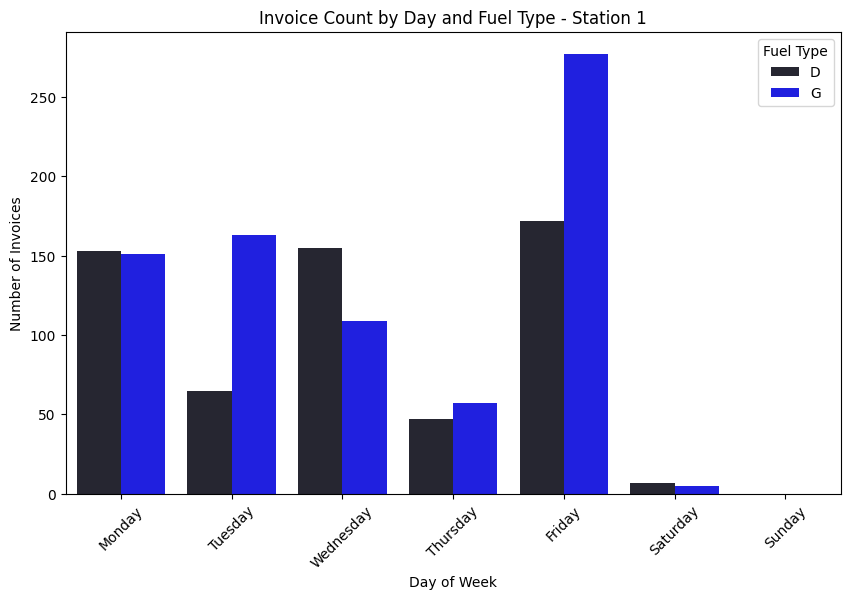

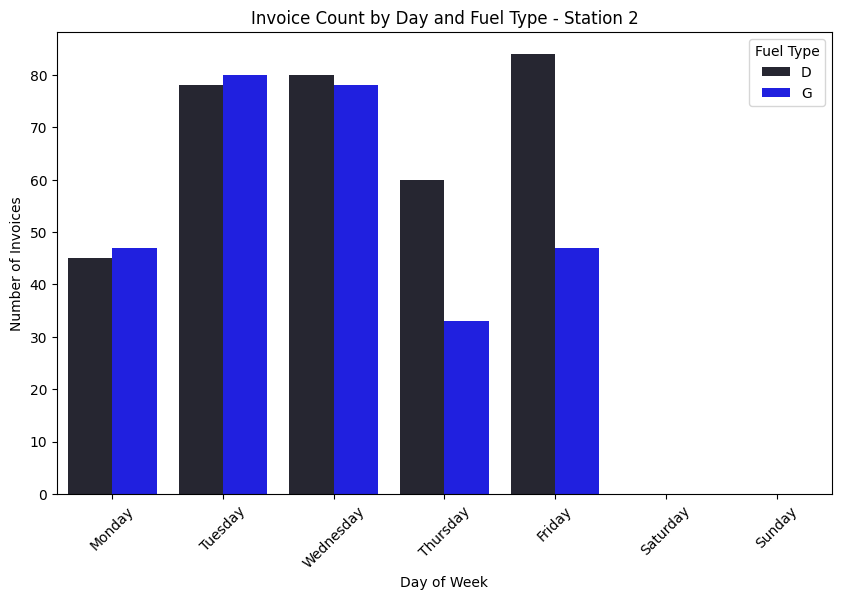

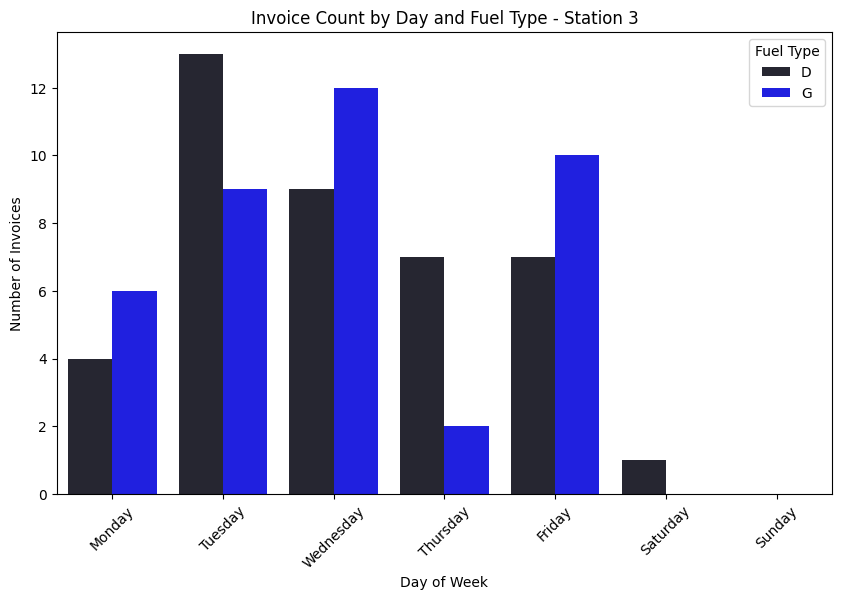

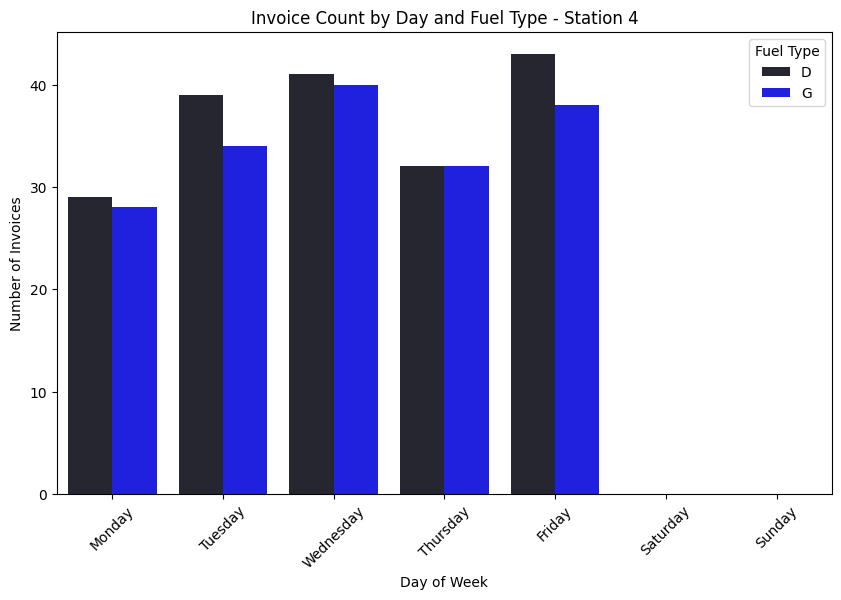

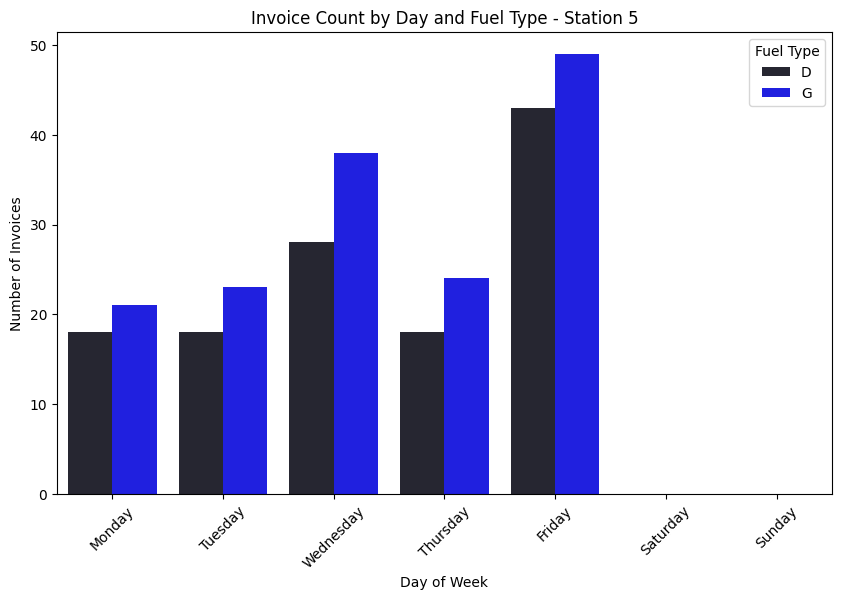

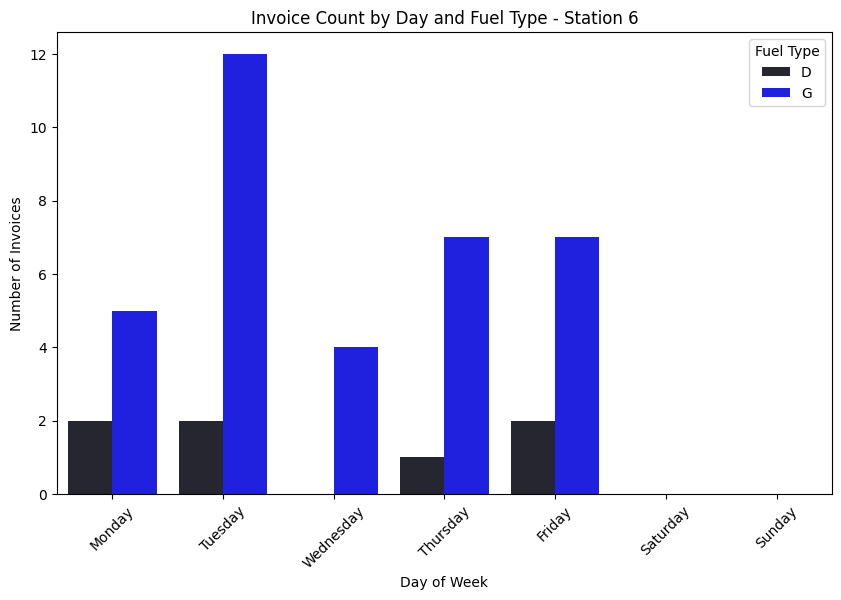

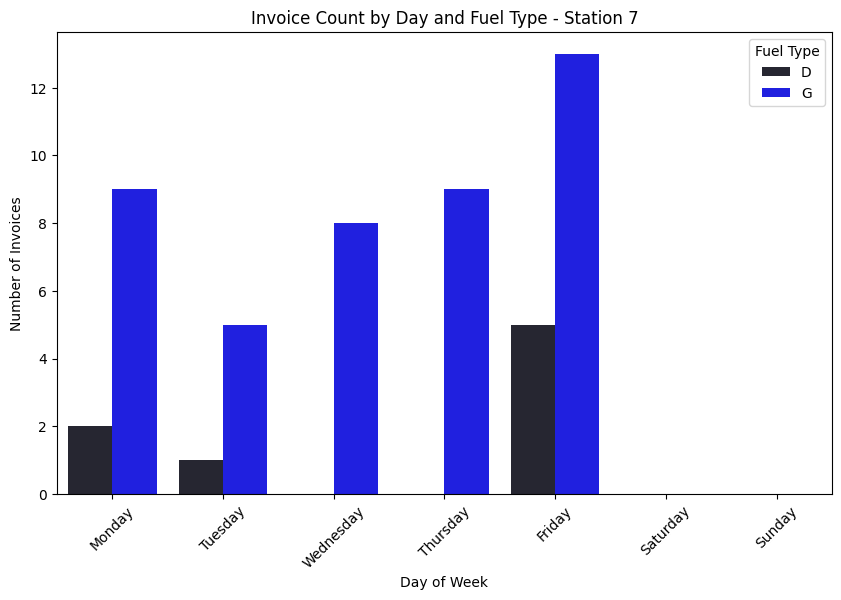

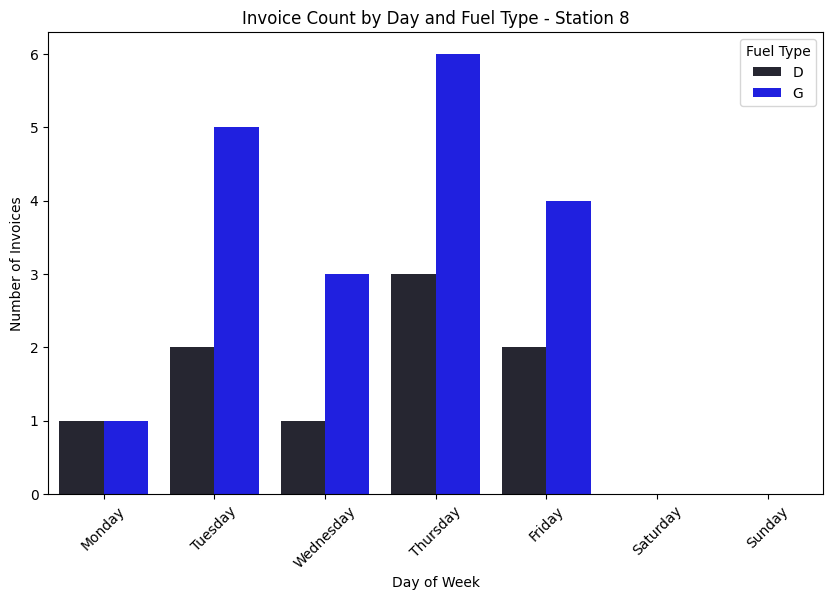

In [ ]:
# Count invoices per location, day, and fuel type
invoice_counts = (
    invoices_clean_df
    .groupby(['invoice_gas_station_location', 'day_of_week', 'fuel_type'])['invoice_id']
    .count()
    .reset_index()
    .rename(columns={'invoice_id': 'invoice_count'})
)

# Reorder days
weekday_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
invoice_counts['day_of_week'] = pd.Categorical(invoice_counts['day_of_week'], categories=weekday_order, ordered=True)

# Plot for each station
for station in invoice_counts['invoice_gas_station_location'].unique():
    station_df = invoice_counts[invoice_counts['invoice_gas_station_location'] == station]

    plt.figure(figsize=(10, 6))
    sns.barplot(data=station_df, x='day_of_week', y='invoice_count', hue='fuel_type', color = 'blue')
    plt.title(f'Invoice Count by Day and Fuel Type - Station {station}')
    plt.xlabel('Day of Week')
    plt.ylabel('Number of Invoices')
    plt.xticks(rotation=45)
    plt.legend(title='Fuel Type')
    plt.savefig(f'3.6 Invoice Count by Day and Fuel Type - Station {station}.png', dpi = 300, bbox_inches="tight")
    plt.show()

## 3.7 Evaluating Gas Station Fuel Inventory Management and Optimization

### 3.7.1 Gas Station Performance Ranking Based on Total Fuel Purchased

Gas Station Performance Ranking (Total Fuel Purchased)
  gas_station_name  total_fuel_purchased
0        EastMount            15,738,669
1         Eastgate             6,283,414
2          Chedoke             3,211,086
3    Mountain View             2,158,447
4          Central               855,334
5         Oakville               441,310
6          Chappel               283,793
7           Circle               104,645


Chart saved as 'gas_station_sales_performance_bar_chart.png'


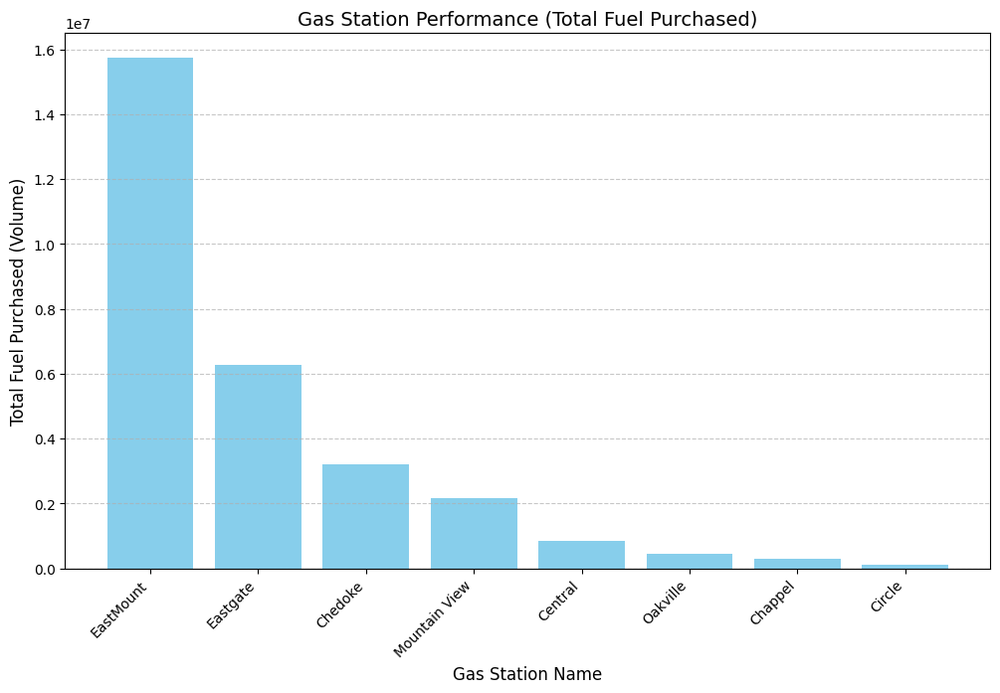

In [ ]:
# Merge Data: Link invoice data with gas station names
invoice_station_df = pd.merge(
    invoices_clean_df,
    locations_df[['gas_station_location', 'gas_station_name']],
    left_on='invoice_gas_station_location',
    right_on='gas_station_location',
    how='left'
)

# Calculate Performance Metric: Group by station name and sum total fuel purchased
station_performance = invoice_station_df.groupby('gas_station_name')['amount_purchased'].sum().sort_values(ascending=False).reset_index()
station_performance.columns = ['gas_station_name', 'total_fuel_purchased']

print("Gas Station Performance Ranking (Total Fuel Purchased)")
print(station_performance.to_string(float_format="{:,.0f}".format))
print("\n")

# Visualization
plt.figure(figsize=(12, 7))
plt.bar(station_performance['gas_station_name'], station_performance['total_fuel_purchased'], color='skyblue')
plt.xlabel('Gas Station Name', fontsize=12)
plt.ylabel('Total Fuel Purchased (Volume)', fontsize=12)
plt.title('Gas Station Performance (Total Fuel Purchased)', fontsize=14)
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.savefig('gas_station_sales_performance_bar_chart.png')
print("Chart saved as 'gas_station_sales_performance_bar_chart.png'")

### 3.7.2 Gas Station Performance Ranking Based on Average Fuel per Transaction

Gas Station Average Fuel per Transaction Ranking
  gas_station_name  average_fuel_per_transaction
0        EastMount                     11,564.05
1          Central                     10,691.67
2         Oakville                     10,507.38
3          Chappel                     10,135.48
4         Eastgate                      9,942.11
5          Chedoke                      9,019.91
6    Mountain View                      7,708.74
7           Circle                      2,012.41


Chart 1 saved as 'gas_station_avg_transaction_performance_bar_chart.png'


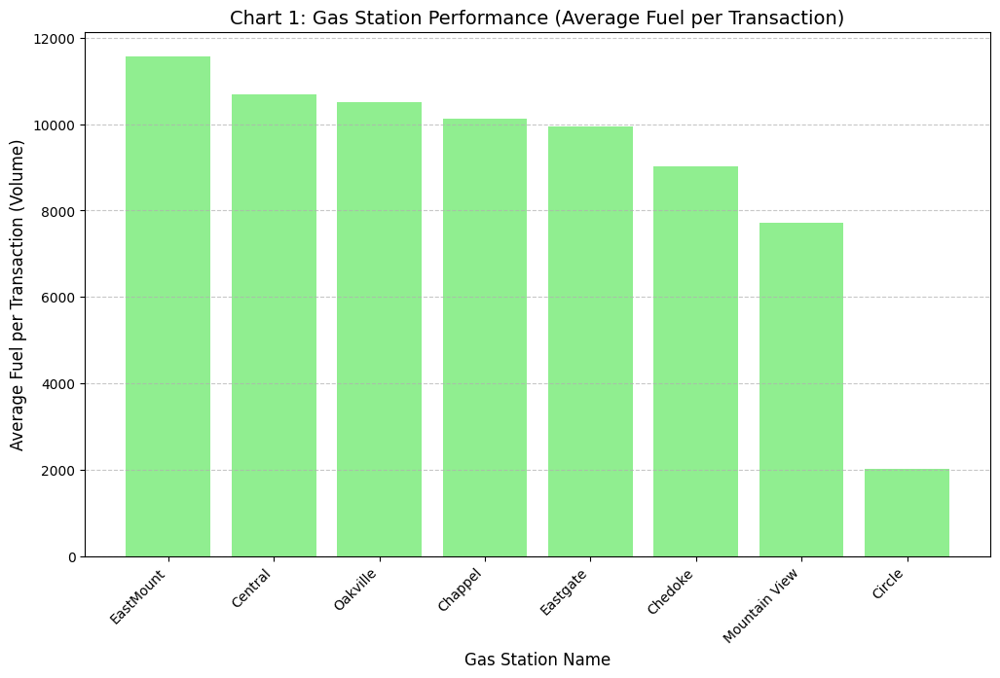

In [ ]:
# Calculate Performance Metric: Group by station name and calculate the mean of 'Amount Purchased'
# This average represents the Average Fuel per Transaction.
station_avg_performance = invoice_station_df.groupby('gas_station_name')['amount_purchased'].mean().sort_values(ascending=False).reset_index()
station_avg_performance.columns = ['gas_station_name', 'average_fuel_per_transaction']

print("Gas Station Average Fuel per Transaction Ranking")
print(station_avg_performance.to_string(float_format="{:,.2f}".format))
print("\n")

# Visualization: Display Average Transaction Volume Performance
plt.figure(figsize=(12, 7))
plt.bar(station_avg_performance['gas_station_name'], station_avg_performance['average_fuel_per_transaction'], color='lightgreen')
plt.xlabel('Gas Station Name', fontsize=12)
plt.ylabel('Average Fuel per Transaction (Volume)', fontsize=12)
plt.title('Chart 1: Gas Station Performance (Average Fuel per Transaction)', fontsize=14)
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.savefig('gas_station_avg_transaction_performance_bar_chart.png')
print("Chart 1 saved as 'gas_station_avg_transaction_performance_bar_chart.png'")

## 3.8 Use More Complicated Metrics to Evaluate the Performance of the Station

### 3.8.1 Using turnover rates to see which station would benefit most from increased tank capacities

In [ ]:
# Turnover Rate = Total Sales / Total Capacity

# Aggregate Sales Data (Total Fuel Purchased)
# Metric: Total Fuel Purchased (proxy for demand)
# Group by location and sum the total fuel purchased
sales_agg = invoices_clean_df.groupby('invoice_gas_station_location')['amount_purchased'].sum().reset_index()
sales_agg.columns = ['gas_station_location', 'total_fuel_purchased']

In [ ]:
# Aggregate Capacity Data (Total Tank Capacity)
# Metric: Total Tank Capacity (physical constraint)
# Group by location and sum the total tank capacity
capacity_agg = tanks_df.groupby('tank_location')['tank_capacity'].sum().reset_index()
capacity_agg.columns = ['gas_station_location', 'total_tank_capacity']

In [ ]:
# Merge Data and Calculate Capacity Strain (Turnover Rate)
# Metric: Turnover Rate = Total Sales / Total Capacity
# Merge sales and capacity data
sales_capacity_agg = pd.merge(sales_agg, capacity_agg, on='gas_station_location', how='inner')

# Calculate Turnover Rate. A higher rate indicates higher strain on current capacity
sales_capacity_agg['turnover_rate'] = sales_capacity_agg['total_fuel_purchased'] / sales_capacity_agg['total_tank_capacity']

In [ ]:
# Merge with location names for final presentation
sales_capacity_locations_df = pd.merge(
    sales_capacity_agg,
    locations_df[['gas_station_location', 'gas_station_name']],
    on='gas_station_location',
    how='left'
)

In [ ]:
# Sort by Turnover Rate (descending) to find which stations benefit most
capacity_benefit_df = sales_capacity_locations_df.sort_values(by='turnover_rate', ascending=False).reset_index(drop=True)

# Format the output DataFrame for clean printing
output_df = capacity_benefit_df[['gas_station_name', 'total_fuel_purchased', 'total_tank_capacity', 'turnover_rate']].copy()
output_df['total_fuel_purchased'] = output_df['total_fuel_purchased'].apply(lambda x: f'{x:,.0f}')
output_df['total_tank_capacity'] = output_df['total_tank_capacity'].apply(lambda x: f'{x:,.0f}')
output_df['turnover_rate'] = output_df['turnover_rate'].apply(lambda x: f'{x:,.2f}')

In [ ]:
# Output Results and Visualization
print("Capacity Strain Analysis: Which Fuel Stations Would Benefit Most?")
print("Benefit is determined by the Turnover Rate (Total Sales / Total Capacity).")
print("Stations with the HIGHEST Turnover Rate are under the MOST strain and benefit most.")
print("-" * 75)
print(output_df.to_string(index=False))
print("-" * 75)

Capacity Strain Analysis: Which Fuel Stations Would Benefit Most?
Benefit is determined by the Turnover Rate (Total Sales / Total Capacity).
Stations with the HIGHEST Turnover Rate are under the MOST strain and benefit most.
---------------------------------------------------------------------------
gas_station_name total_fuel_purchased total_tank_capacity turnover_rate
       EastMount           15,738,669             240,000         65.58
   Mountain View            2,158,447              50,000         43.17
         Chedoke            3,211,086              80,000         40.14
        Eastgate            6,283,414             220,000         28.56
         Central              855,334              60,000         14.26
          Circle              104,645              10,000         10.46
        Oakville              441,310              90,000          4.90
         Chappel              283,793              80,000          3.55
---------------------------------------------------

In [ ]:
# Identify top 3 for conclusion
top_3_benefit = capacity_benefit_df.head(3)['gas_station_name'].tolist()
print(f"\nConclusion: The stations that would benefit most from increased tank capacity are (in order):")
print(f"1. **{top_3_benefit[0]}** (Highest priority due to high sales and capacity strain)")
print(f"2. **{top_3_benefit[1]}**")
print(f"3. **{top_3_benefit[2]}**")


Conclusion: The stations that would benefit most from increased tank capacity are (in order):
1. **EastMount** (Highest priority due to high sales and capacity strain)
2. **Mountain View**
3. **Chedoke**



Chart saved as 'capacity_strain_turnover_rate_chart.png'


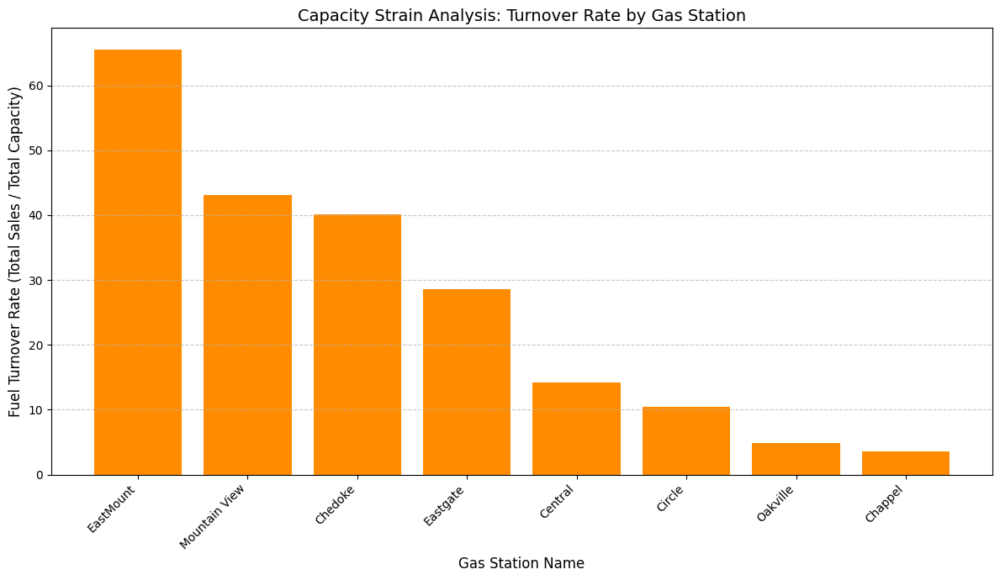

In [ ]:
# Visualize Results
plt.figure(figsize=(12, 7))
plt.bar(capacity_benefit_df['gas_station_name'], capacity_benefit_df['turnover_rate'], color='darkorange')
plt.xlabel('Gas Station Name', fontsize=12)
plt.ylabel('Fuel Turnover Rate (Total Sales / Total Capacity)', fontsize=12)
plt.title('Capacity Strain Analysis: Turnover Rate by Gas Station', fontsize=14)
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.savefig('capacity_strain_turnover_rate_chart.png')
print("\nChart saved as 'capacity_strain_turnover_rate_chart.png'")

### 3.8.2 Using low safety stick frequency to see which station would have higher inventory risk


--- Analysis Conclusion and Improvement Suggestions ---
Stations that Work Better: EastMount
Stations that Work Not Very Well: Circle

Areas for Improvement (Identify where we could improve):
1. Low Sales Performance (Primary Focus):
The following stations are at the bottom of the performance ranking (Total Fuel Purchased < 1 million): Central, Oakville, Chappel, Circle
It is recommended to conduct in-depth market research (e.g., location foot traffic, competition, local pricing strategies) and operational assessment (e.g., customer service quality) for these stations to determine the specific causes of their low sales.

2. Inventory Risk:
   Some stations show low fuel level readings, potentially suggesting a risk of stockouts. It is recommended to optimize fuel procurement and inventory management strategies.
Chart 2 saved as 'gas_station_low_fuel_percentage_bar_chart.png'

Analysis Conclusion and Improvement Suggestions (Based on Average Transaction Volume)
Stations that Work Bette

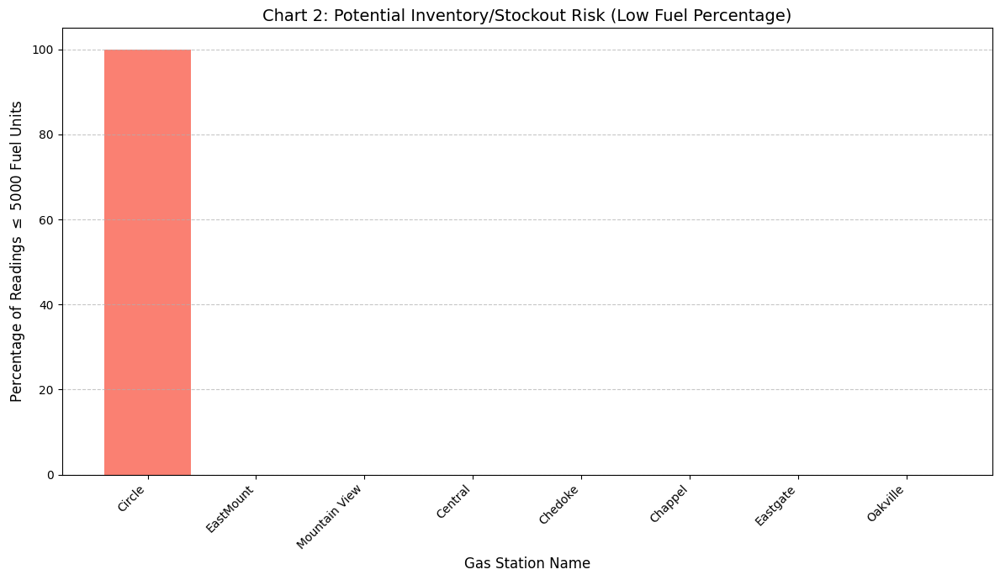

In [ ]:
# Identify best and worst performing stations
best_station = station_performance.iloc[0]['gas_station_name']
worst_station = station_performance.iloc[-1]['gas_station_name']
low_performing_stations = station_performance.tail(4)['gas_station_name'].tolist()


# Inventory Check (Auxiliary analysis for improvement areas) ---
# Standardize column names for Fuel Level Part 1 for concatenation
fuel_level_clean_df['tank_id'] = fuel_level_clean_df['tank_id'].str.strip()
fuel_level_clean_df['fuel_level'] = pd.to_numeric(fuel_level_clean_df['fuel_level'], errors='coerce')

# Merge fuel level data to get station names
fuel_tanks_df = pd.merge(fuel_level_clean_df, tanks_df[['tank_id', 'tank_location', 'tank_capacity']], on='tank_id', how='left')
fuel_tanks_locations_df = pd.merge(fuel_tanks_df, locations_df[['gas_station_location', 'gas_station_name']],
                                 left_on='tank_location', right_on='gas_station_location', how='left')

# Check for potential stockouts (Fuel Level <= 5000 units)
LOW_FUEL_THRESHOLD = 5000
low_fuel_counts = fuel_tanks_locations_df[fuel_tanks_locations_df['fuel_level'] <= LOW_FUEL_THRESHOLD].groupby('gas_station_name').size()
total_counts = fuel_tanks_locations_df.groupby('gas_station_name').size()
# Calculate the percentage of low fuel readings
low_fuel_percentage = (low_fuel_counts / total_counts * 100).fillna(0).sort_values(ascending=False)

print('\n--- Analysis Conclusion and Improvement Suggestions ---')
print(f'Stations that Work Better: {best_station}')
print(f'Stations that Work Not Very Well: {worst_station}')


print('\nAreas for Improvement (Identify where we could improve):')
print('1. Low Sales Performance (Primary Focus):')
print(f'The following stations are at the bottom of the performance ranking (Total Fuel Purchased < 1 million): {', '.join(low_performing_stations)}')
print('It is recommended to conduct in-depth market research (e.g., location foot traffic, competition, local pricing strategies) and operational assessment (e.g., customer service quality) for these stations to determine the specific causes of their low sales.')
if low_fuel_percentage.max() == 0:
    print('\n2. Inventory Risk (No Issues Found):')
    print(' The analysis shows the percentage of low fuel level readings is 0.0% (threshold ≤ 5000) for all stations, indicating that fuel stockouts are currently not the reason for poor performance. Improvement should focus on sales and marketing strategies.')
else:
    print('\n2. Inventory Risk:')
    print('   Some stations show low fuel level readings, potentially suggesting a risk of stockouts. It is recommended to optimize fuel procurement and inventory management strategies.')

# Visualize Inventory Risk (even if results are 0, we create the chart to show the analysis process)
plt.figure(figsize=(12, 7))
plt.bar(low_fuel_percentage.index, low_fuel_percentage.values, color='salmon')
plt.xlabel('Gas Station Name', fontsize=12)
plt.ylabel(f'Percentage of Readings $\\leq$ {LOW_FUEL_THRESHOLD} Fuel Units', fontsize=12)
plt.title('Chart 2: Potential Inventory/Stockout Risk (Low Fuel Percentage)', fontsize=14)
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.savefig('gas_station_low_fuel_percentage_bar_chart.png')
print("Chart 2 saved as 'gas_station_low_fuel_percentage_bar_chart.png'")


# Identify stations that work better and those that work not very well
best_station_avg = station_avg_performance.iloc[0]['gas_station_name']
worst_station_avg = station_avg_performance.iloc[-1]['gas_station_name']

print("\nAnalysis Conclusion and Improvement Suggestions (Based on Average Transaction Volume)")
print(f"Stations that Work Better: {best_station_avg}")
print(f"Stations that Work Not Very Well: {worst_station_avg}")

print("\n **Identify where we could improve:**")
print("The lowest performing stations based on Average Fuel per Transaction are:")
print(station_avg_performance.tail(3)[['gas_station_name', 'average_fuel_per_transaction']].to_string(index=False, float_format="{:,.2f}".format))
print("\n")

print("1. High-Efficiency Stations (Eastgate, EastMount) Improvement Focus:")
print("   These stations have the highest average transaction volume, suggesting they attract fleet customersor high-volume purchasers. Improvement should focus on maintaining strong customer relationships, offering volume discounts, or providing fast-lane service to retain the current transaction size.")

print("2. Low-Efficiency Stations (Circle, Chappel, Central) Improvement Focus:")
print("   These stations have the lowest average transaction volume. This may indicate they primarily serve small private vehicles or customers making small, intermittent refills.")
print("   Strategic Suggestions: Implement measures to incentivize customers to purchase more fuel at once, such as: loyalty point rewards, minimum purchase discounts, or bundle offers with car washes/convenience store items to increase the total customer spend.")

# 4. Tank Level Analysis

## 4.1 Assumptions for Safety Line

In [ ]:
# For most of the tanks(tank capcity between (5000, 70000)), we assume 5000 to be the safety line
tank_df_temp = tanks_df[tanks_df['tank_capacity'].lt(70000).eq(1) & tanks_df['tank_capacity'].gt(5000).eq(1)]
tank_df_temp['Low_Safety_Stock_Rate'] = 5000/tank_df_temp['tank_capacity']

# Their average safety level is calculated as follows
avg_safety_level = round(tank_df_temp['Low_Safety_Stock_Rate'].mean(),4)

# Safety Level for the rest tanks are calculated by avg_safety_level * their capacity
def safety_level(row):
    """
    Set the safety level to be 5000 if tank capacity is between (5000,70000).
    Else, calculate the safety level as avg_safety_level * tank_capacity.
    """
    if 5000 < row['tank_capacity'] < 70000:
        return 5000
    else:
        return avg_safety_level * row['tank_capacity']
tanks_df['safety_level'] = tanks_df.apply(safety_level, axis = 1)
tanks_df['safey_level_rate'] = tanks_df.safety_level / tanks_df.tank_capacity
tanks_df["station_fuel_type"] = tanks_df["tank_location"].astype(str) + "-" + tanks_df["tank_type"]
tanks_df = tanks_df.sort_values('station_fuel_type').reset_index(drop = True)

display(tanks_df)

,tank_id,tank_location,tank_number,tank_type,tank_capacity,safety_level,safey_level_rate,station_fuel_type
0,T12,1,3,D,40000,5000.0,0.12,1-D
1,T15,1,6,D,40000,5000.0,0.12,1-D
2,T10,1,1,G,40000,5000.0,0.12,1-G
3,T11,1,2,G,40000,5000.0,0.12,1-G
4,T13,1,4,G,40000,5000.0,0.12,1-G
5,T14,1,5,G,40000,5000.0,0.12,1-G
6,T17,2,2,D,40000,5000.0,0.12,2-D
7,T19,2,4,D,70000,10073.0,0.14,2-D
8,T16,2,1,G,70000,10073.0,0.14,2-G
9,T18,2,3,G,40000,5000.0,0.12,2-G


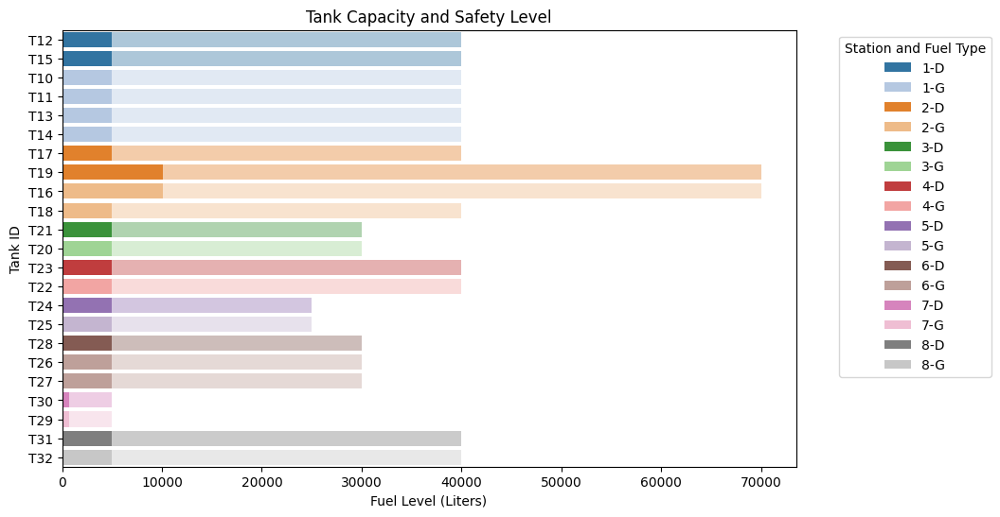

In [ ]:
plt.figure(figsize=(10, 6))

sns.barplot(
    data=tanks_df,
    y="tank_id",
    x="tank_capacity",
    hue="station_fuel_type",
    dodge=False,
    palette="tab20",
    alpha=0.4,
    legend=False
)

sns.barplot(
    data=tanks_df,
    y="tank_id",
    x="safety_level",
    hue="station_fuel_type",
    dodge=False,
    palette="tab20",
    alpha=1,
)

plt.title("Tank Capacity and Safety Level")
plt.xlabel("Fuel Level (Liters)")
plt.ylabel("Tank ID")
plt.legend(title="Station and Fuel Type", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.savefig('4.1 Tank Cpacity and Safety Level.png', dpi= 300)
plt.show()

## 4.2 Fuel Level Over Time for Each Tank

### 4.2.1 Merge Fuel Level DF and Tanks DF together

In [ ]:
tank_fuel_df = fuel_level_clean_df.merge(tanks_df,
                                         on = 'tank_id',
                                         how = 'left',
                                         validate = 'm:1',
                                         indicator = True)
tank_fuel_df.head()

,tank_id,fuel_level,timestamp,tank_location,tank_number,tank_type,tank_capacity,safety_level,safey_level_rate,station_fuel_type,_merge
0,T12,27161.0,2017-01-01 00:10:00,1,3,D,40000,5000.0,0.12,1-D,both
1,T12,27017.0,2017-01-01 00:25:00,1,3,D,40000,5000.0,0.12,1-D,both
2,T12,26934.0,2017-01-01 00:40:00,1,3,D,40000,5000.0,0.12,1-D,both
3,T12,26786.0,2017-01-01 00:55:00,1,3,D,40000,5000.0,0.12,1-D,both
4,T12,26748.0,2017-01-01 01:10:00,1,3,D,40000,5000.0,0.12,1-D,both


### 4.2.2 Plot Fuel Level Over Time for Each Tank

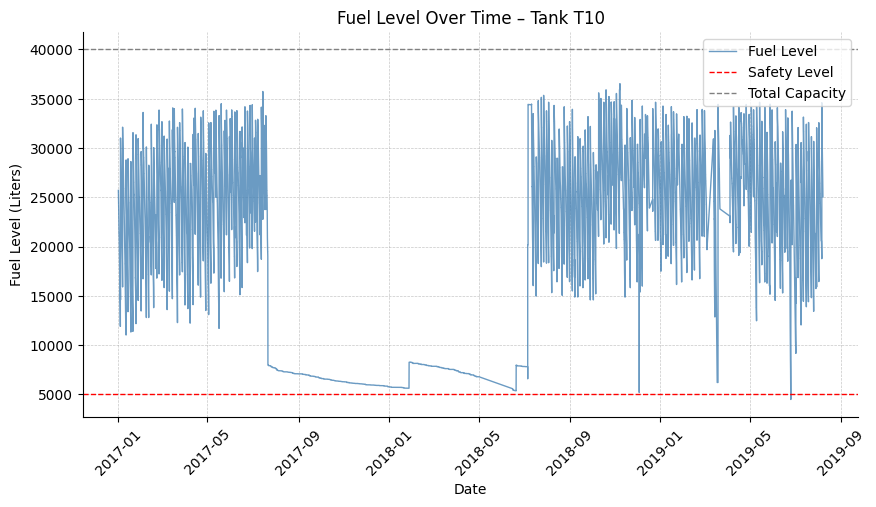

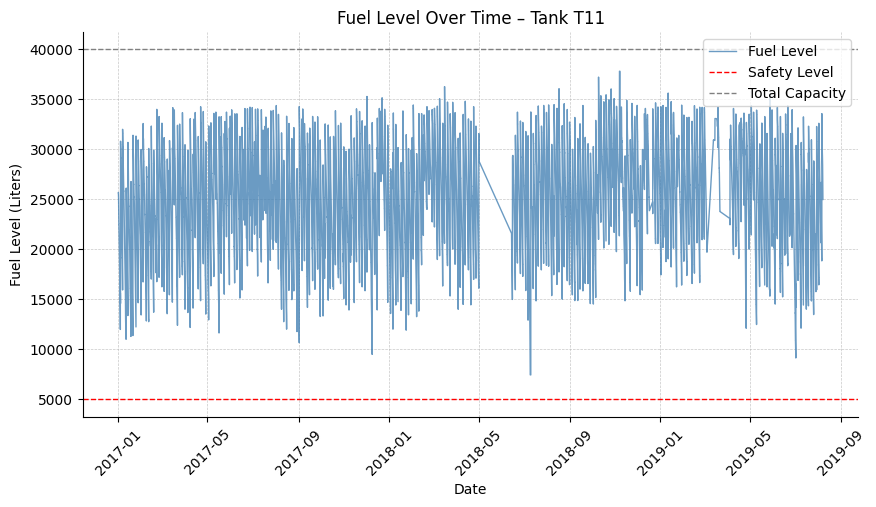

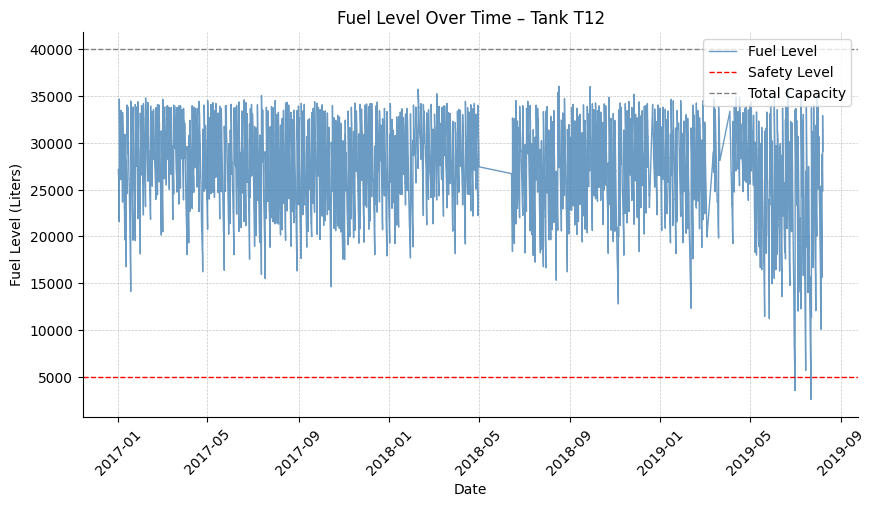

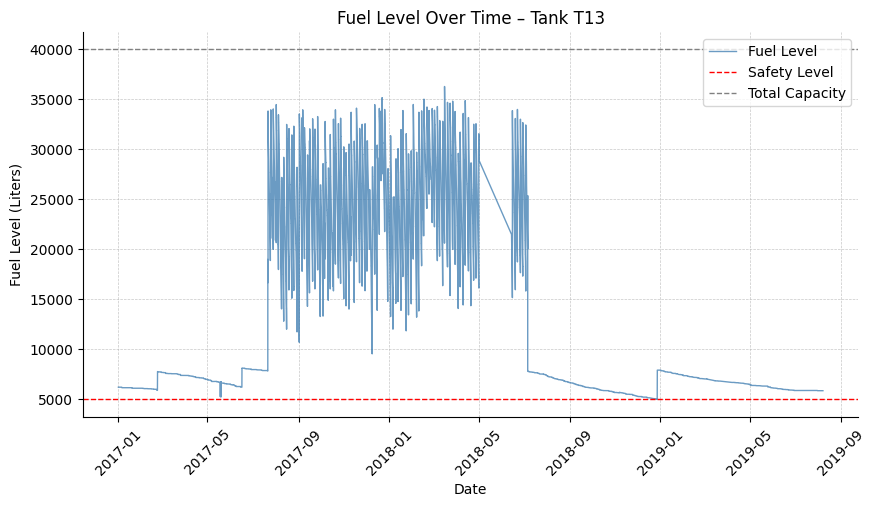

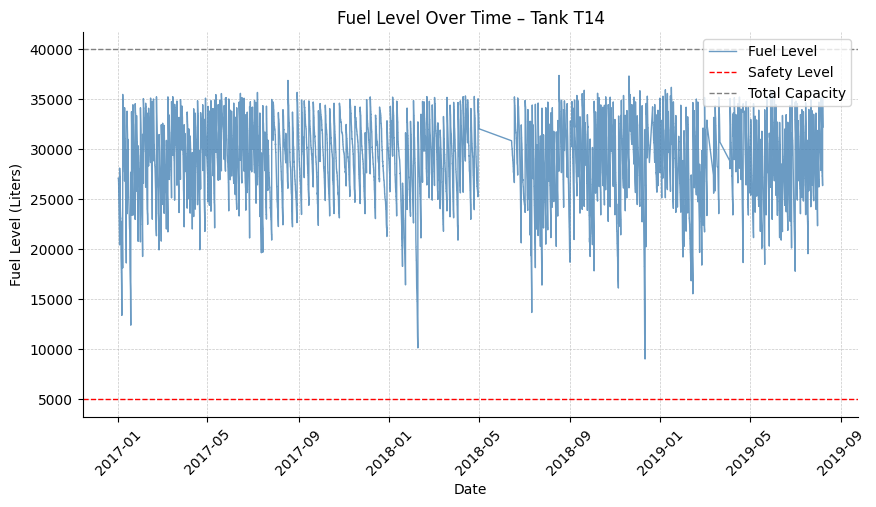

...

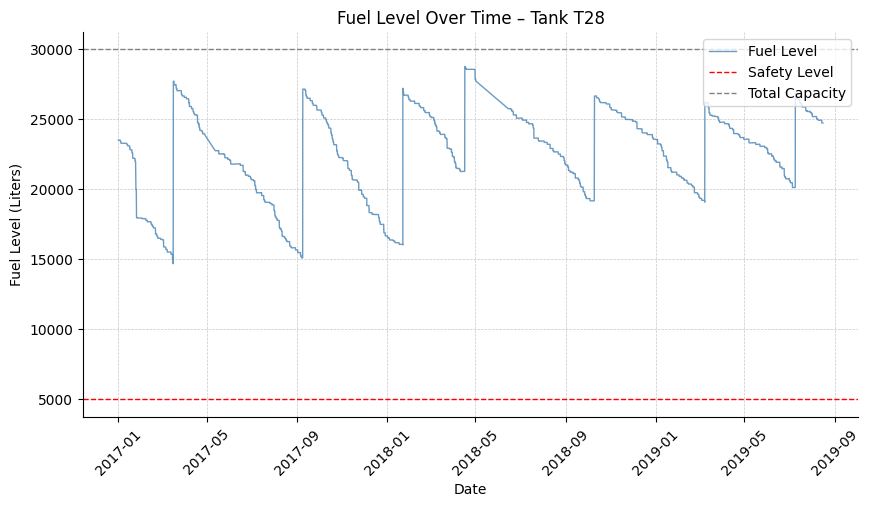

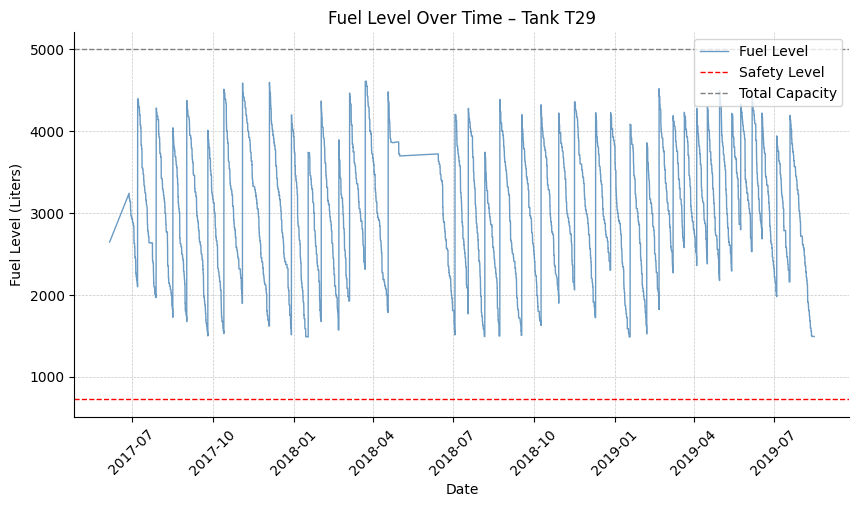

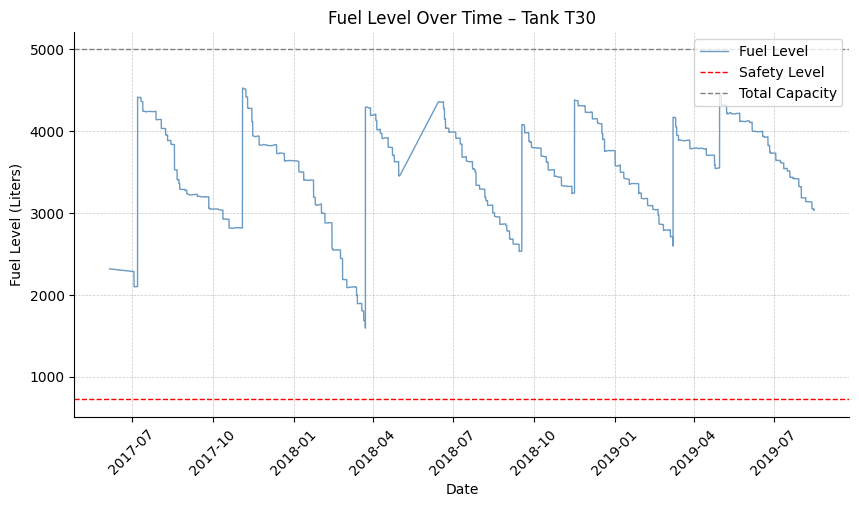

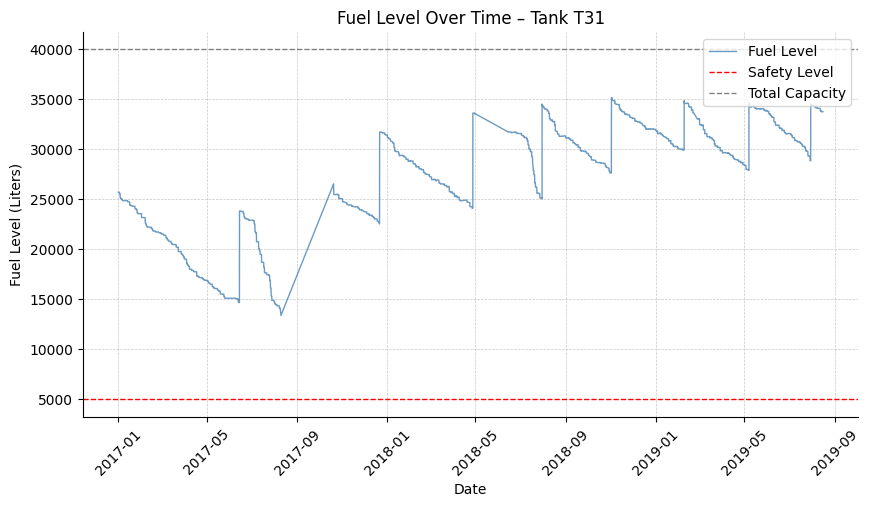

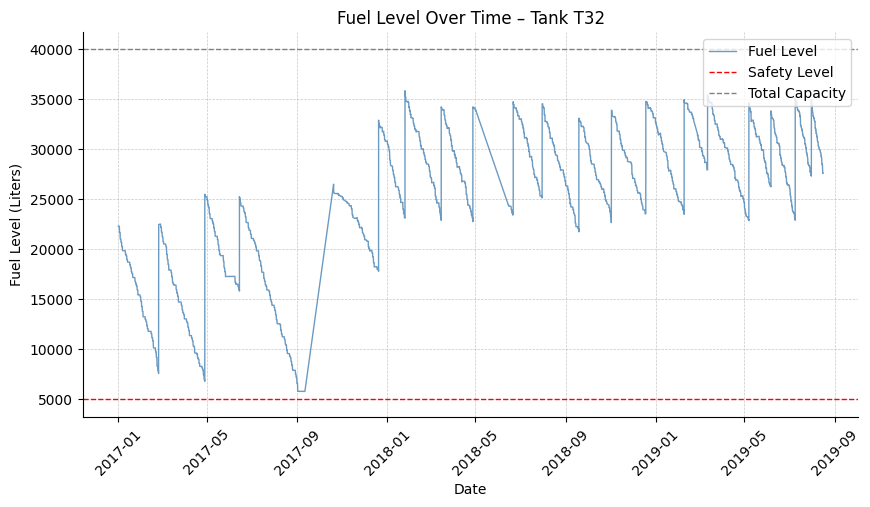

In [ ]:
tank_id_list = tanks_df.sort_values('tank_id').tank_id.unique()

for tank in tank_id_list:
    tank_data = tank_fuel_df[tank_fuel_df["tank_id"] == tank].copy()

    fig, ax = plt.subplots(figsize=(10, 5))
    ax.plot(tank_data["timestamp"],
            tank_data["fuel_level"],
            color="steelblue",
            linewidth=1,
            alpha=0.8,
            label="Fuel Level")

    ax.set_title(f"Fuel Level Over Time – Tank {tank}")
    ax.set_xlabel("Date")
    ax.set_ylabel("Fuel Level (Liters)")
    plt.xticks(rotation=45)

    ax.grid(True, linestyle="--", linewidth=0.5, alpha=0.7)
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)

    cap = tanks_df.loc[tanks_df["tank_id"] == tank, "tank_capacity"].values[0]
    safe = tanks_df.loc[tanks_df["tank_id"] == tank, "safety_level"].values[0]
    ax.axhline(y=safe, color="red", linestyle="--", linewidth=1, label="Safety Level")
    ax.axhline(y=cap, color="gray", linestyle="--", linewidth=1, label="Total Capacity")

    ax.legend(loc="upper right")
    plt.savefig(f"4.2_Fuel_Level_Over_Time_Tank_{tank}.png", dpi=300)
    plt.show()

### 4.2.3 Confirm which Tanks are Under Each Station and  Fuel Type

In [ ]:
tank_summary = (tanks_df
                .groupby(["station_fuel_type"])
                .agg(tank_id_list=("tank_id", list),
                     total_capacity=("tank_capacity", "sum"),
                     total_safety_level=("safety_level", "sum"))
                .reset_index())

display(tank_summary)

,station_fuel_type,tank_id_list,total_capacity,total_safety_level
0,1-D,"[T12, T15]",80000,10000.0
1,1-G,"[T10, T11, T13, T14]",160000,20000.0
2,2-D,"[T17, T19]",110000,15073.0
3,2-G,"[T16, T18]",110000,15073.0
4,3-D,[T21],30000,5000.0
5,3-G,[T20],30000,5000.0
6,4-D,[T23],40000,5000.0
7,4-G,[T22],40000,5000.0
8,5-D,[T24],25000,5000.0
9,5-G,[T25],25000,5000.0


Since the `invoice data` is only available at the station and fuel type level, we aggregate all tanks of the same fuel type within each station to analyze their operational efficiency and improvement strategies.

For example, for `Station 1’s diesel`, `Tanks 12` and `Tank 15` are treated as a single aggregated tank. We assume that when Station 1 requires a diesel refill, both tanks are refilled simultaneously, with an overall discount applied.

## 4.3 Fuel Level Over time After Changing Strategies

In [ ]:
# Calculate the difference in fuel_level between consecutive timestamps:
# A positive value indicates that the station refilled the tank, while a negative value indicates that customers consumed fuel.
tank_fuel_df = tank_fuel_df.sort_values(["tank_id", "timestamp"]).copy()
tank_fuel_df["diff_fuel_level"] = tank_fuel_df.groupby("tank_id")["fuel_level"].diff()

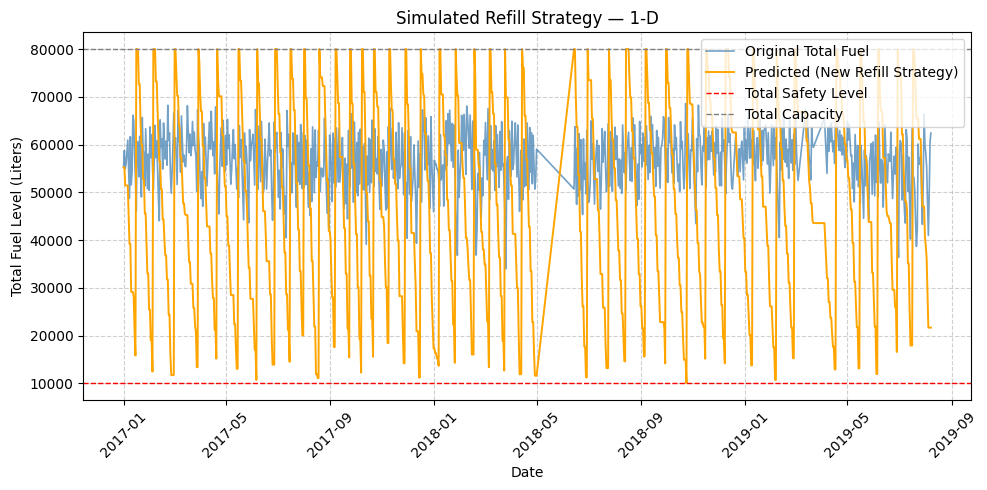

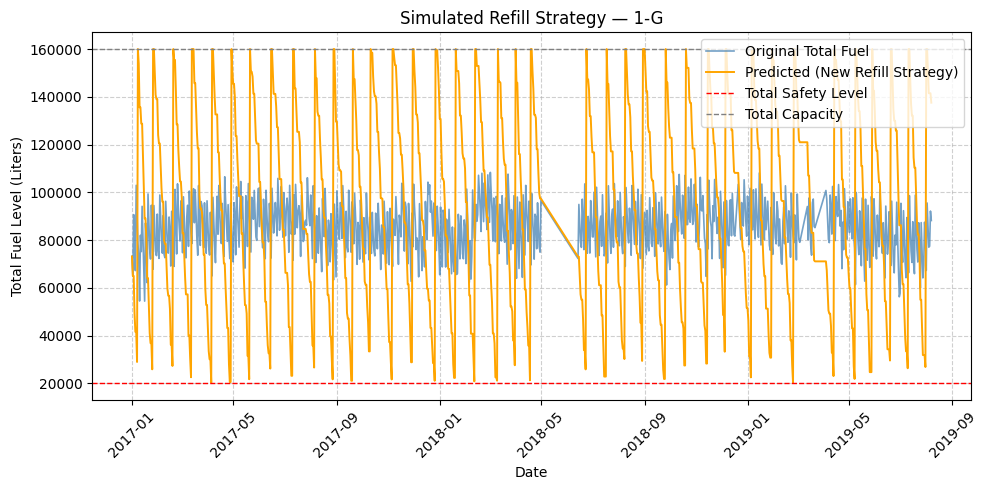

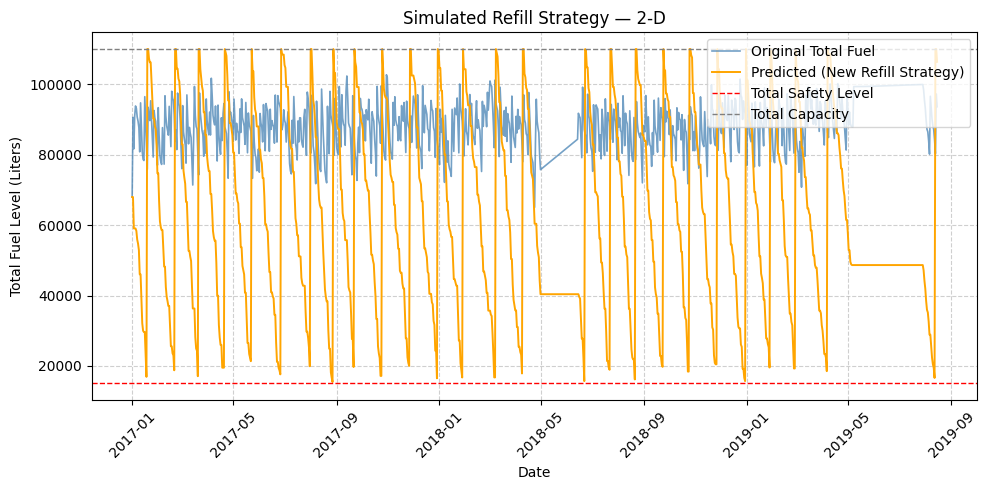

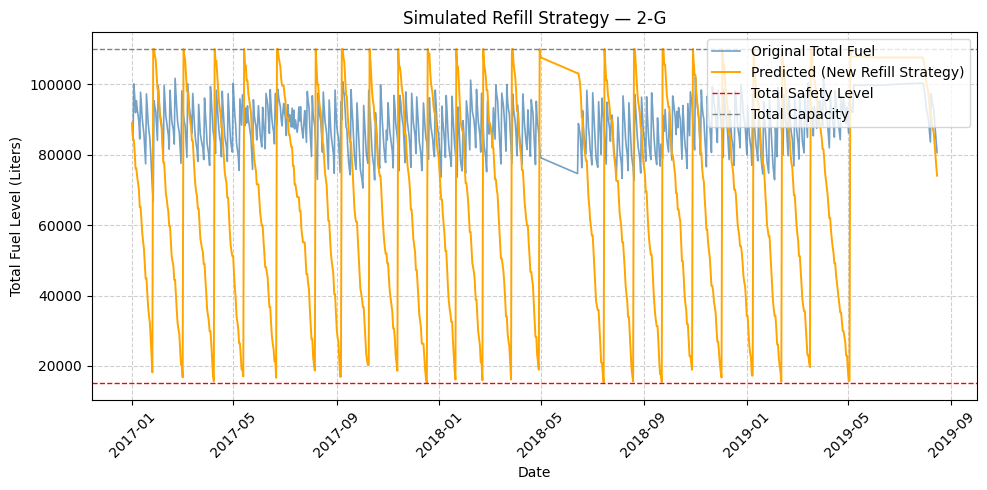

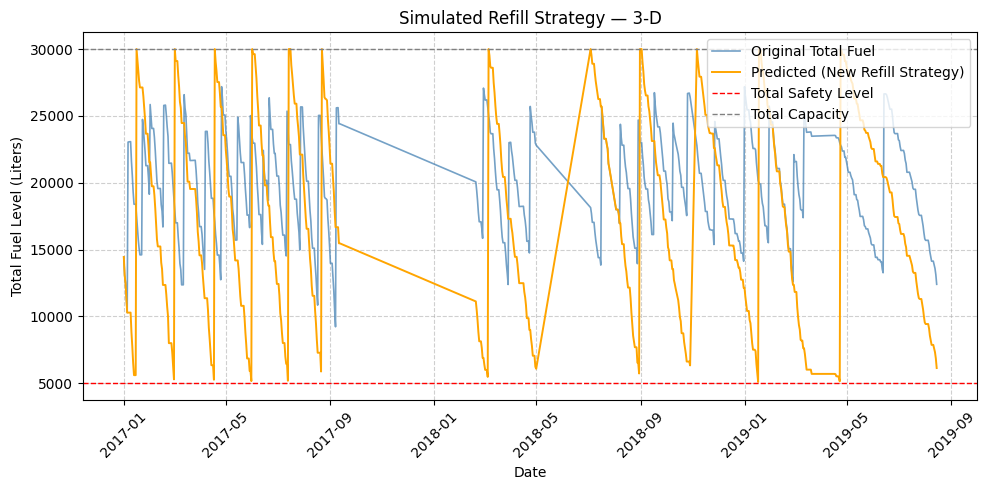

...

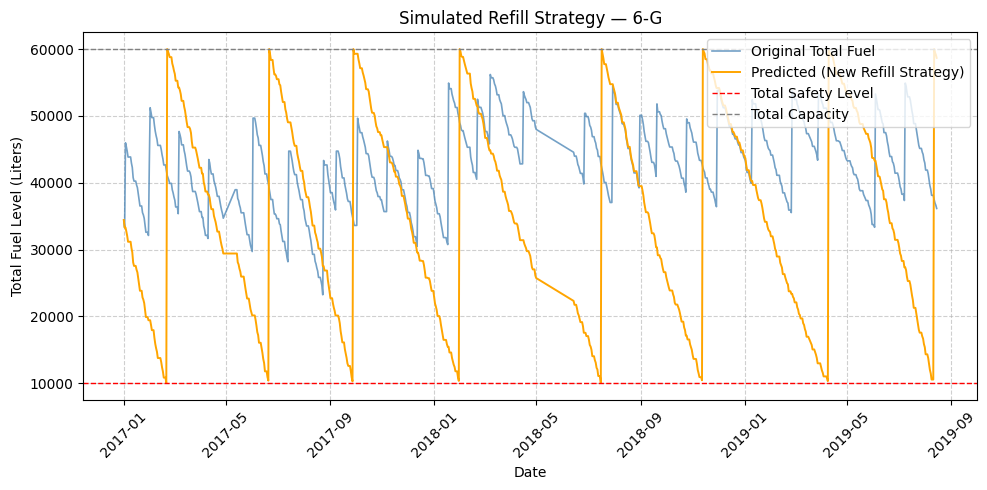

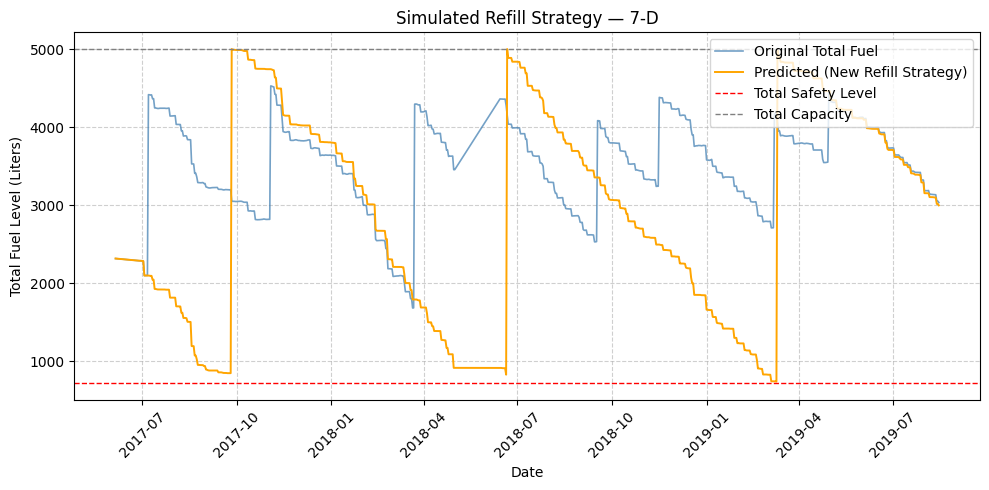

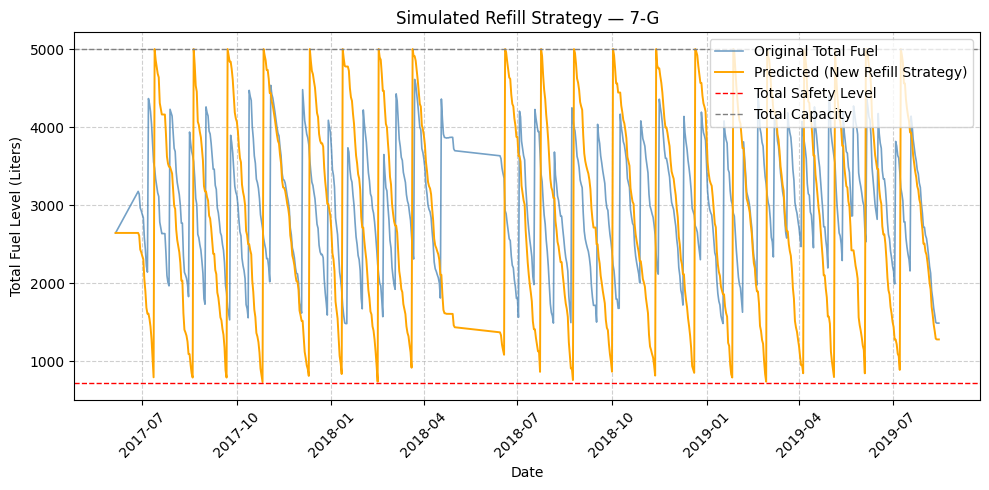

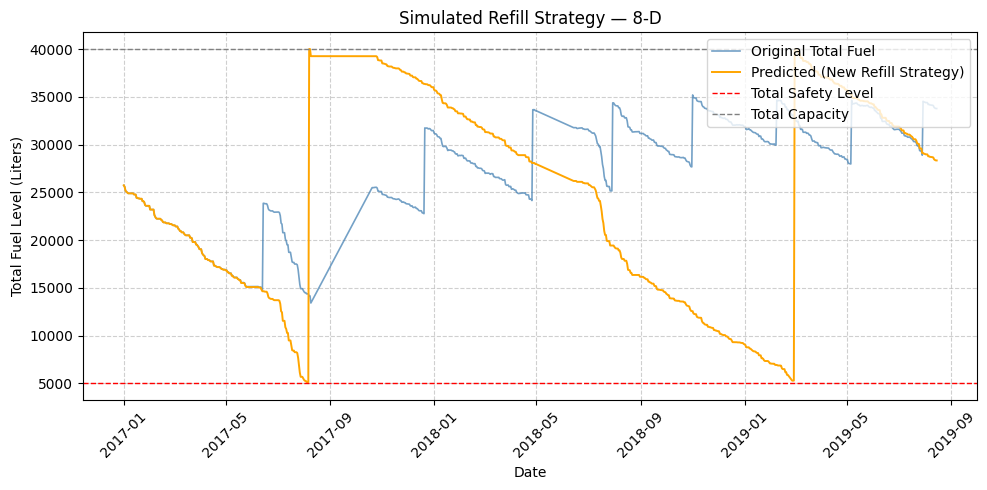

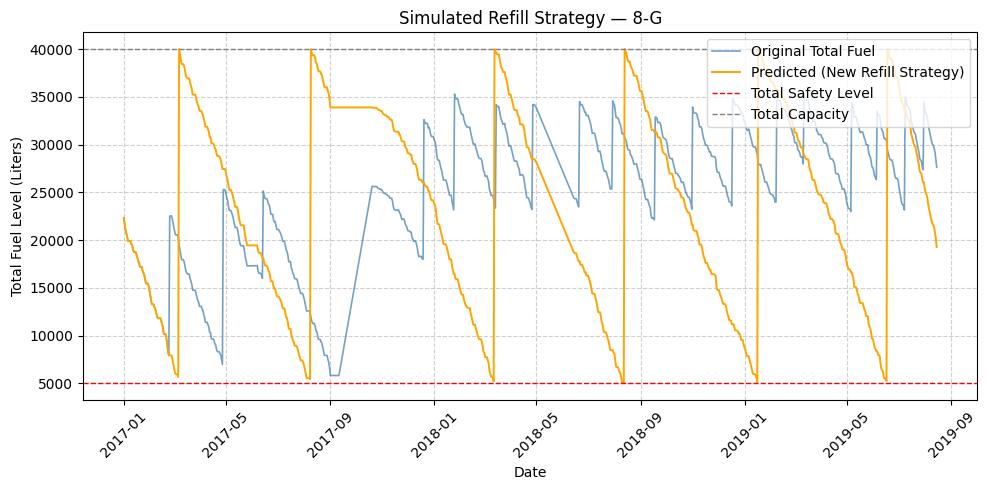

In [ ]:
summary_map = (tank_summary
               .set_index("station_fuel_type")[["total_capacity", "total_safety_level"]]
               .to_dict("index"))

for sft, df_sub in tank_fuel_df.groupby("station_fuel_type"):
    cap_total  = summary_map[sft]["total_capacity"]
    safe_total = summary_map[sft]["total_safety_level"]

    df_sub = df_sub.sort_values("timestamp").copy()
    df_sub["date"] = df_sub["timestamp"].dt.date

    daily_last_per_tank = (df_sub.groupby(["tank_id", "date"], as_index=False)["fuel_level"].last())

    daily_total = (daily_last_per_tank
                   .groupby("date", as_index=False)["fuel_level"].sum()
                   .rename(columns={"fuel_level": "total_fuel"})
                   .sort_values("date")
                   .reset_index(drop=True))

    daily_total["diff"] = daily_total["total_fuel"].diff().fillna(0)

    predicted = []
    current_level = float(daily_total.loc[0, "total_fuel"])
    for i, row in daily_total.iterrows():
        if i > 0:
            diff = float(row["diff"])
            if diff < 0:
                current_level += diff
            if current_level <= safe_total:
                current_level = cap_total
        predicted.append(current_level)

    daily_total["predicted_total_fuel"] = predicted

    # plot
    plt.figure(figsize=(10, 5))
    plt.plot(daily_total["date"], daily_total["total_fuel"],
             label="Original Total Fuel", linewidth=1.2, alpha=0.75, color="steelblue")
    plt.plot(daily_total["date"], daily_total["predicted_total_fuel"],
             label="Predicted (New Refill Strategy)", linewidth=1.4, color="orange")
    plt.axhline(y=safe_total, color="red", linestyle="--", linewidth=1, label="Total Safety Level")
    plt.axhline(y=cap_total,  color="gray", linestyle="--", linewidth=1, label="Total Capacity")

    plt.title(f"Simulated Refill Strategy — {sft}")
    plt.xlabel("Date")
    plt.ylabel("Total Fuel Level (Liters)")
    plt.legend(loc="upper right")
    plt.grid(True, linestyle="--", alpha=0.6)
    plt.xticks(rotation=45)
    plt.tight_layout()

    plt.savefig(f"4.3 Refill_Strategy_{sft}.png", dpi=300)
    plt.plot()

## 4.4 Calculate Amount Saved Based on New Strategy

### 4.4.1 Calculate price per liter before discount

In [ ]:
invoices_clean_df["station_fuel_type"] = invoices_clean_df["invoice_gas_station_location"].astype(str) + "-" + invoices_clean_df["fuel_type"]
invoices_clean_df['discount_tier'].unique()

def ppl_bf_discount(row):
    """
    Calculate price per liter before discount based on price_per_liter and discount_tier
    """
    if row['discount_tier'] == 'Tier 0 (<15k L)':
        return row['price_per_liter']
    if row['discount_tier'] == 'Tier 1 (15k–25k L)':
        return row['price_per_liter'] + 0.02
    if row['discount_tier'] == 'Tier 2 (25k–40k L)':
        return row['price_per_liter'] + 0.03
    else:
        return row['price_per_liter'] + 0.04


invoices_clean_df['ppl_bf_discount'] = invoices_clean_df.apply(ppl_bf_discount, axis = 1)
invoices_clean_df['purchased_cost_bf_discount'] = invoices_clean_df.ppl_bf_discount * invoices_clean_df.amount_purchased

### 4.4.2 Calculate The Total Purchase Cost for Tanks Using Previous Strategies

In [ ]:
tank_prev_cost_summary = invoices_clean_df.groupby(by = ['station_fuel_type'])['gross_purchase_cost'].sum().reset_index()

tank_prev_cost_summary.rename(columns = {'gross_purchase_cost': 'previous_purchase_cost'},inplace = True)

tanks_result_df = tank_summary.merge(tank_prev_cost_summary[['station_fuel_type','previous_purchase_cost']],
                                     on = 'station_fuel_type',
                                     how = 'inner',
                                     validate = '1:1')
tanks_result_df

,station_fuel_type,tank_id_list,total_capacity,total_safety_level,previous_purchase_cost
0,1-D,"[T12, T15]",80000,10000.0,5.90e+06
1,1-G,"[T10, T11, T13, T14]",160000,20000.0,1.23e+07
2,2-D,"[T17, T19]",110000,15073.0,4.02e+06
3,2-G,"[T16, T18]",110000,15073.0,3.04e+06
4,3-D,[T21],30000,5000.0,4.93e+05
5,3-G,[T20],30000,5000.0,4.47e+05
6,4-D,[T23],40000,5000.0,1.97e+06
7,4-G,[T22],40000,5000.0,1.73e+06
8,5-D,[T24],25000,5000.0,9.95e+05
9,5-G,[T25],25000,5000.0,1.49e+06


### 4.4.3 Calculate The Total Purchase Cost for Tanks Using NEW Strategies

In [ ]:
# Calculate total refill quantity for each station and fuel type
station_refill = (invoices_clean_df
                  .groupby("station_fuel_type")["amount_purchased"]
                  .sum()
                  .reset_index()
                  .rename(columns={"amount_purchased": "total_refill_quantity"}))

In [ ]:
# Calculate price baseline for each station and fuel type
total_cost_bf_discount = (invoices_clean_df
                          .groupby(["station_fuel_type"])["purchased_cost_bf_discount"]
                          .sum()
                          .reset_index())

price_baseline = station_refill.merge(total_cost_bf_discount,
                                       on = 'station_fuel_type',
                                       how = 'inner')
price_baseline['ppl_bf_discount'] = price_baseline.purchased_cost_bf_discount / price_baseline.total_refill_quantity
price_baseline = price_baseline[["station_fuel_type", "ppl_bf_discount"]]
price_baseline

,station_fuel_type,ppl_bf_discount
0,1-D,1.21
1,1-G,1.15
2,2-D,1.16
3,2-G,1.08
4,3-D,1.14
5,3-G,1.06
6,4-D,1.21
7,4-G,1.10
8,5-D,1.23
9,5-G,1.10


In [ ]:
# Calculate NEW price per liter for each station and fuel type
tanks_result_df = (
    tanks_result_df
    .merge(station_refill, on="station_fuel_type", how="left")
    .merge(price_baseline, on="station_fuel_type", how="left")
)
tanks_result_df

def compute_new_ppl(row):
    """
    Compute price per liter for NEW Strategies
    """
    if (row["total_capacity"] - row["total_safety_level"]) < 15000:
        return row["ppl_bf_discount"]
    elif (row["total_capacity"] - row["total_safety_level"]) < 25000:
        return row["ppl_bf_discount"] - 0.02
    elif (row["total_capacity"] - row["total_safety_level"]) < 40000:
        return row["ppl_bf_discount"] - 0.03
    else:
        return row["ppl_bf_discount"] - 0.04

tanks_result_df["new_price_per_litter"] = tanks_result_df.apply(compute_new_ppl, axis=1)
tanks_result_df["new_purchase_cost"] = (tanks_result_df["total_refill_quantity"] * tanks_result_df["new_price_per_litter"])


### 4.4.4 Calculate and Plot The Amounts Saved and Saving Ratios

In [ ]:
tanks_result_df["amount_saved"] = tanks_result_df["previous_purchase_cost"] - tanks_result_df["new_purchase_cost"]
tanks_result_df["saving_ratio(%)"] = tanks_result_df["amount_saved"] / tanks_result_df["previous_purchase_cost"]
tanks_result_df["saving_ratio(%)"] = tanks_result_df["saving_ratio(%)"].mul(100).round(3)
display(tanks_result_df)

,station_fuel_type,tank_id_list,total_capacity,total_safety_level,previous_purchase_cost,total_refill_quantity,ppl_bf_discount,new_price_per_litter,new_purchase_cost,amount_saved,saving_ratio(%)
0,1-D,"[T12, T15]",80000,10000.0,5.90e+06,4.87e+06,1.21,1.17,5.70e+06,1.93e+05,3.27
1,1-G,"[T10, T11, T13, T14]",160000,20000.0,1.23e+07,1.09e+07,1.15,1.11,1.21e+07,2.46e+05,2.00
2,2-D,"[T17, T19]",110000,15073.0,4.02e+06,3.46e+06,1.16,1.12,3.88e+06,1.32e+05,3.28
3,2-G,"[T16, T18]",110000,15073.0,3.04e+06,2.82e+06,1.08,1.04,2.93e+06,1.09e+05,3.60
4,3-D,[T21],30000,5000.0,4.93e+05,4.32e+05,1.14,1.11,4.80e+05,1.26e+04,2.56
5,3-G,[T20],30000,5000.0,4.47e+05,4.24e+05,1.06,1.03,4.36e+05,1.11e+04,2.48
6,4-D,[T23],40000,5000.0,1.97e+06,1.63e+06,1.21,1.18,1.92e+06,4.86e+04,2.47
7,4-G,[T22],40000,5000.0,1.73e+06,1.58e+06,1.10,1.07,1.68e+06,4.74e+04,2.74
8,5-D,[T24],25000,5000.0,9.95e+05,8.12e+05,1.23,1.21,9.78e+05,1.62e+04,1.63
9,5-G,[T25],25000,5000.0,1.49e+06,1.35e+06,1.10,1.08,1.46e+06,2.69e+04,1.81


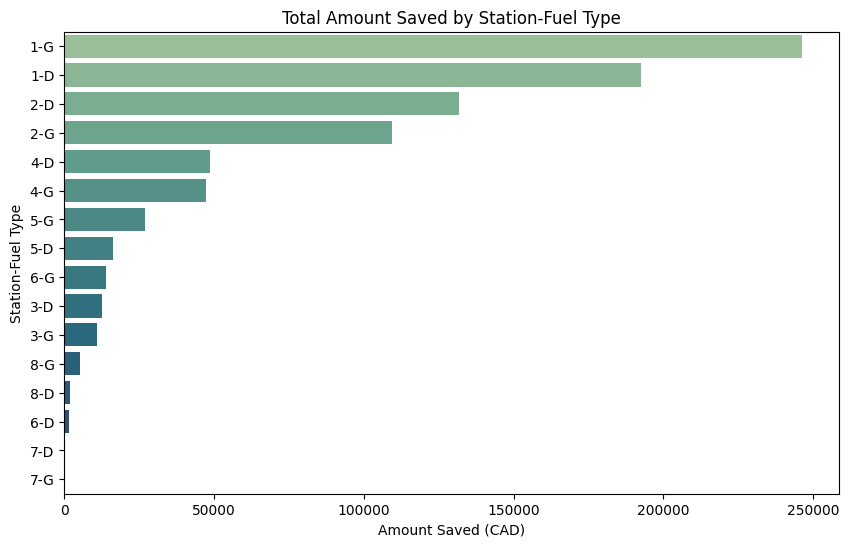

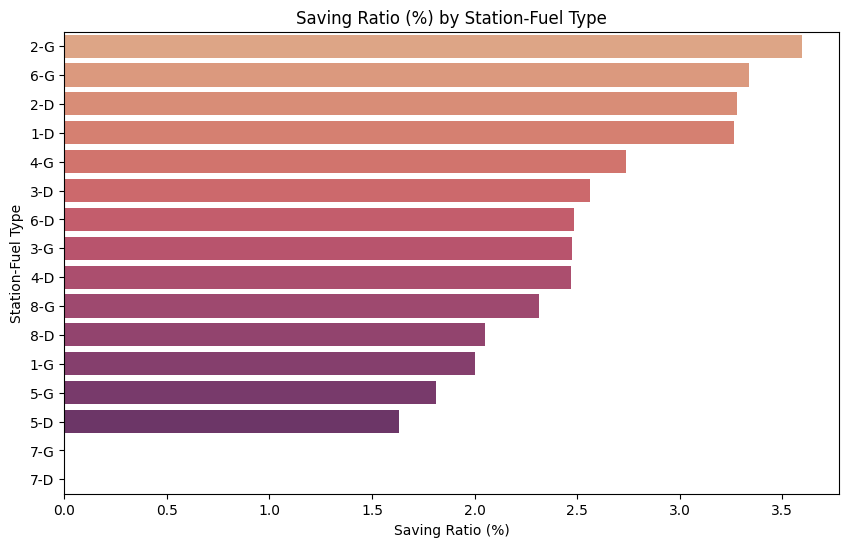

In [ ]:
plt.figure(figsize=(10, 6))
sns.barplot(data=tanks_result_df.sort_values("amount_saved", ascending=False),
            x="amount_saved",
            y="station_fuel_type",
            palette="crest")

plt.title("Total Amount Saved by Station-Fuel Type")
plt.xlabel("Amount Saved (CAD)")
plt.ylabel("Station-Fuel Type")
plt.savefig('4.3 Total Amount Saved by Station Fuel Type.png', dpi=300)
plt.show()


plt.figure(figsize=(10, 6))
sns.barplot(data=tanks_result_df.sort_values("saving_ratio(%)", ascending=False),
            x="saving_ratio(%)",
            y="station_fuel_type",
            palette="flare")
plt.title("Saving Ratio (%) by Station-Fuel Type")
plt.xlabel("Saving Ratio (%)")
plt.ylabel("Station-Fuel Type")
plt.savefig('4.4 Saving Ratio (%) by Station-Fuel Type.png', dpi=300)
plt.show()
